In [1]:
import numpy as np
import pandas as pd
from astropy.io import fits
from astropy import units as u
from astropy import constants as const
import matplotlib.pyplot as plt
plt.rcParams['figure.facecolor'] = 'white'
import matplotlib.colors as mcolors
#import os.path
#import glob

In [43]:
from scipy.stats import ks_2samp

In [2]:
from scipy.stats import linregress

In [3]:
import seaborn as sns

In [4]:
from astropy.cosmology import LambdaCDM#, FlatLambdaCDM
cosmo = LambdaCDM(H0=69.7,Om0=0.3,Ode0=0.7)

In [4]:
#califaoutpath = '/vol/aibn1081/data1/brodriguez/CALIFA/'
#acaoutpath    = '/vol/aibn1081/data1/brodriguez/ACA/'
#califainpath  = '/vol/alcina/data1/shared/EDGE/PIPE3DS_v2.3/'
#acainpath     = '/vol/alcina/data1/shared/EDGE/aca_edge_natv/cubes/'

In [5]:
def create_bins(number,bin_width=1):
    q = np.floor(number/bin_width)
    return q*bin_width

In [6]:
G = const.G.to(u.kpc**3/(u.Msun*u.s**2)).value # gravitational constant
k_B = (const.k_B).to(u.Msun*u.kpc**2/u.s**2/u.K).value # Boltzmann constant
S_H1 = 7.*10**6 # average atomic gas mass surface density in M_sun kpc^-2
Z_sun = 4.9*10**-4 # solar metallicity, Baumgartner & Mushotzky 2006
alphaCO_MW = 4.3 # M_sun/(K km s^-1 pc^2) from Milky Way observations

def S_mol(CO_int,inc,alphaCO=alphaCO_MW,R_21=0.65):
    cos = np.cos(np.deg2rad(inc))
    return CO_int*cos*alphaCO*10**6/R_21

def star_vdisp(S_Mstar,Re):
    hs = Re/(1.68*7.3)
    return np.sqrt(2*np.pi*G*S_Mstar*hs)*u.kpc.to(u.km)

def Ph(S_mol,S_Mstar,star_vdisp,CO_vdisp=11):
    Ph = (np.pi*G/2)*(S_mol+S_H1)*((S_mol+S_H1)+S_Mstar*CO_vdisp/star_vdisp)
    #Ph = (np.pi*G/2)*(S_mol+S_H1)*((S_mol+S_H1)+S_Mstar/1.6*CO_vdisp/(star_vdisp/np.sqrt(1.6)))
    return Ph/k_B/(u.kpc**3).to(u.cm**3)

def Pde(S_mol,S_Mstar,Re,CO_vdisp=11):
    hs = Re/(1.68*7.3)
    Pde = (np.pi*G/2)*(S_mol+S_H1)**2 + (S_mol+S_H1)*np.sqrt(G*S_Mstar/hs/2)*CO_vdisp/u.kpc.to(u.km)
    #Pde = (np.pi*G/2)*(S_mol+S_H1)**2 + (S_mol+S_H1)*np.sqrt(G*S_Mstar/1.6/hs/2)*CO_vdisp/u.kpc.to(u.km)
    return Pde/k_B/(u.kpc**3).to(u.cm**3)

In [7]:
stages = ['SF','QnR','cQ','MX','nR','fR']

In [8]:
Database = pd.read_csv('/users/brodriguez/Documents/ACA_database_2024-03-11.csv')
Database['Source'] = Database['Source'].astype("category")
Database['Final_QS'] = Database['Final_QS'].astype("category")
Database['Final_NA'] = Database['Final_NA'].astype("category")
Database.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87463 entries, 0 to 87462
Data columns (total 21 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   Source        87463 non-null  category
 1   Final_QS      87463 non-null  category
 2   Final_NA      87463 non-null  category
 3   Inclination   87463 non-null  float64 
 4   PA            87463 non-null  float64 
 5   Area_kpc2     87463 non-null  float64 
 6   Re_kpc        87463 non-null  float64 
 7   Rgal_kpc      87463 non-null  float64 
 8   RA            87463 non-null  float64 
 9   DEC           87463 non-null  float64 
 10  T_gal         87463 non-null  float64 
 11  S_Mstar       87463 non-null  float64 
 12  S_SFR         87128 non-null  float64 
 13  S_SFR2        87463 non-null  float64 
 14  Ha_mask       87463 non-null  float64 
 15  Z_O3N2        80468 non-null  float64 
 16  Z_N2          84993 non-null  float64 
 17  alphaCO_O3N2  80468 non-null  float64 
 18  alphaC

In [9]:
Database = Database[Database['Inclination']<70]

In [10]:
Database['star_vdisp'] = star_vdisp(Database['S_Mstar'],Database['Re_kpc'])
Database['S_mol_MW'] = S_mol(Database['CO_int'],Database['Inclination'])
Database['S_mol_O3'] = S_mol(Database['CO_int'],Database['Inclination'],alphaCO=Database['alphaCO_O3N2'])
Database['P_h_MW'] = Ph(Database['S_mol_MW'],Database['S_Mstar'],Database['star_vdisp'])
Database['P_h_O3'] = Ph(Database['S_mol_O3'],Database['S_Mstar'],Database['star_vdisp'])
Database['P_h_MW_vdisp'] = Ph(Database['S_mol_MW'],Database['S_Mstar'],Database['star_vdisp'],Database['CO_vdisp'])
Database['P_h_O3_vdisp'] = Ph(Database['S_mol_O3'],Database['S_Mstar'],Database['star_vdisp'],Database['CO_vdisp'])
#Database['P_DE_MW'] = Pde(Database['S_mol_MW'],Database['S_Mstar'],Database['Re_kpc'])

In [11]:
Database['Rgal_Re'] = Database['Rgal_kpc']/Database['Re_kpc']
Database['log_S_Mstar'] = np.log10(Database['S_Mstar'])
Database['log_S_SFR'] = np.log10(Database['S_SFR'])
Database['log_S_SFR2'] = np.log10(Database['S_SFR2'])
Database['log_S_mol_MW'] = np.log10(Database['S_mol_MW'])
Database['log_S_mol_O3'] = np.log10(Database['S_mol_O3'])
Database['log_P_h_MW'] = np.log10(Database['P_h_MW'])
Database['log_P_h_O3'] = np.log10(Database['P_h_O3'])
Database['log_P_h_MW_vdisp'] = np.log10(Database['P_h_MW_vdisp'])
Database['log_P_h_O3_vdisp'] = np.log10(Database['P_h_O3_vdisp'])
#Database['log_P_DE_MW'] = np.log10(Database['P_DE_MW'])
#Database['log_S_SFR2'] = np.log10(Database['S_SFR2'])

In [12]:
Database_SF = Database[np.floor(Database['Ha_mask'])==1].copy()
Database_nonSF = Database[np.floor(Database['Ha_mask'])!=1].copy()

In [13]:
print(len(Database_SF))
print(len(Database_nonSF))

16488
51381


In [20]:
total_bysource = Database.groupby('Source')
SF_bysource    = Database_SF.groupby('Source')
nonSF_bysource = Database_nonSF.groupby('Source')

In [21]:
total_byQS = Database.groupby('Final_QS')
total_byQS.count()['Source']

Final_QS
MX      9146
QnR     8290
SF     21961
cQ     10209
fR      9982
nR      8281
Name: Source, dtype: int64

In [22]:
SF_byQS = Database_SF.groupby('Final_QS')
SF_byQS.count()['Source']

Final_QS
MX       557
QnR     2516
SF     10231
cQ      3137
fR         7
nR        40
Name: Source, dtype: int64

In [23]:
nonSF_byQS = Database_nonSF.groupby('Final_QS')
nonSF_byQS.count()['Source']

Final_QS
MX      8589
QnR     5774
SF     11730
cQ      7072
fR      9975
nR      8241
Name: Source, dtype: int64

In [53]:
Database_SF['SFR'] = Database_SF['S_SFR']*Database_SF['Area_kpc2']

In [89]:
Database_SF.loc[Database_SF['log_P_h_MW']<=5,'SFR'].count()

10723

In [90]:
Database_SF.loc[Database_SF['log_P_h_MW']>5,'SFR'].count()

1498

In [54]:
Database_SF.loc[Database_SF['log_P_h_MW']<=5,'SFR'].sum()

14.991327929647696

In [55]:
Database_SF.loc[Database_SF['log_P_h_MW']>5,'SFR'].sum()

12.644910697766356

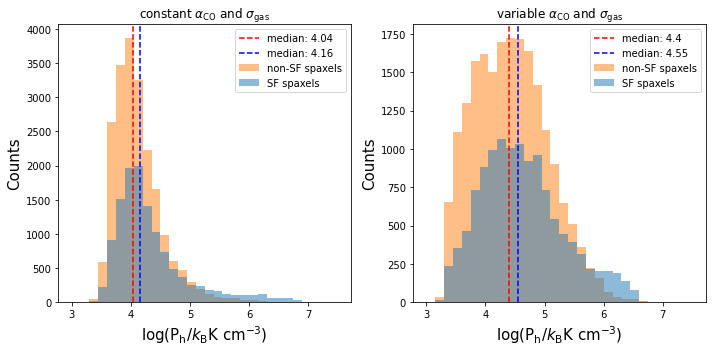

In [18]:
fig, axs = plt.subplots(1,2,figsize=(10,5))#,sharey='row')
for ax,SF,nonSF,title_type in zip(axs.ravel(),[Database_SF['log_P_h_MW'],Database_SF['log_P_h_O3_vdisp']],[Database_nonSF['log_P_h_MW'],Database_nonSF['log_P_h_O3_vdisp']],['constant','variable']):
    ax.hist(nonSF,alpha=0.5,label=r'non-SF spaxels',color='tab:orange',bins=np.linspace(3.,7.5,31))
    median = np.nanmedian(nonSF)
    ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
    ax.hist(SF,alpha=0.5,label=r'SF spaxels',bins=np.linspace(3.,7.5,31))
    median = np.nanmedian(SF)
    ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_ylabel('Counts',size=15)
    ax.set_title(title_type+r' $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$')
    ax.legend(loc='best')
fig.tight_layout()
plt.show()

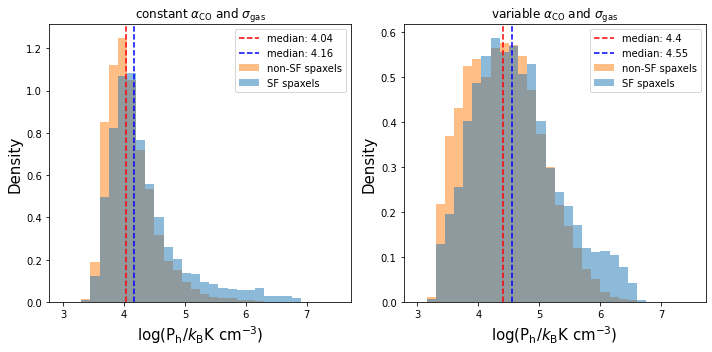

In [19]:
fig, axs = plt.subplots(1,2,figsize=(10,5))#,sharey='row')
for ax,SF,nonSF,title_type in zip(axs.ravel(),[Database_SF['log_P_h_MW'],Database_SF['log_P_h_O3_vdisp']],[Database_nonSF['log_P_h_MW'],Database_nonSF['log_P_h_O3_vdisp']],['constant','variable']):
    ax.hist(nonSF,alpha=0.5,label=r'non-SF spaxels',color='tab:orange',bins=np.linspace(3.,7.5,31),density=True)
    median = np.nanmedian(nonSF)
    ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
    ax.hist(SF,alpha=0.5,label=r'SF spaxels',bins=np.linspace(3.,7.5,31),density=True)
    median = np.nanmedian(SF)
    ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_ylabel('Density',size=15)
    ax.set_title(title_type+r' $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$')
    ax.legend(loc='best')
fig.tight_layout()
plt.show()

In [94]:
ks_O3 = ks_2samp(Database_SF['log_P_h_O3_vdisp'],Database_nonSF['log_P_h_O3_vdisp'],method='exact')

In [95]:
print(ks_O3.pvalue)

4.2633e-320


In [56]:
ks_2samp(Database_SF['log_P_h_O3_vdisp'],Database_nonSF['log_P_h_O3_vdisp'],alternative='greater')

KstestResult(statistic=0.34524361799584563, pvalue=0.0, statistic_location=6.692548810626331, statistic_sign=1)

In [47]:
ks_2samp(Database_SF['log_P_h_MW'],Database_nonSF['log_P_h_MW'])

KstestResult(statistic=0.33996519409031717, pvalue=0.0, statistic_location=6.93668618986762, statistic_sign=1)

In [46]:
ks_2samp(Database_SF['log_P_h_MW'],Database_nonSF['log_P_h_MW'],alternative='greater')

KstestResult(statistic=0.33996519409031717, pvalue=0.0, statistic_location=6.93668618986762, statistic_sign=1)

In [45]:
ks_2samp(Database_SF['log_P_h_MW'],Database_nonSF['log_P_h_MW'],alternative='less')

KstestResult(statistic=0.00015569957766489557, pvalue=0.9992660457948452, statistic_location=3.381716750054338, statistic_sign=-1)

/users/brodriguez/.local/lib/python3.10/site-packages/matplotlib/axes/_axes.py:6731: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/users/brodriguez/.local/lib/python3.10/site-packages/matplotlib/axes/_axes.py:6732: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))
/users/brodriguez/.local/lib/python3.10/site-packages/matplotlib/axes/_axes.py:6731: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/users/brodriguez/.local/lib/python3.10/site-packages/matplotlib/axes/_axes.py:6732: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


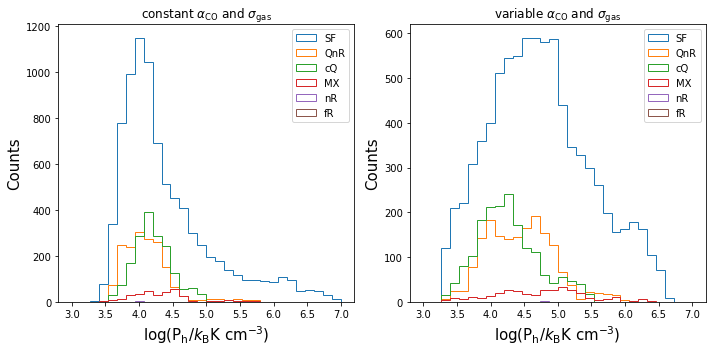

In [39]:
fig, axs = plt.subplots(1,2,figsize=(10,5))#,sharey='row')
for ax,name,title_type in zip(axs.ravel(),['log_P_h_MW','log_P_h_O3_vdisp'],['constant','variable']):
    for QS in stages:
        this_group = SF_byQS.get_group(QS)
        ax.hist(this_group[name],label=QS,bins=np.linspace(3.,7.,31),histtype='step')
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_ylabel('Counts',size=15)
    ax.set_title(title_type+r' $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$')
    ax.legend(loc='best')
fig.tight_layout()
plt.show()

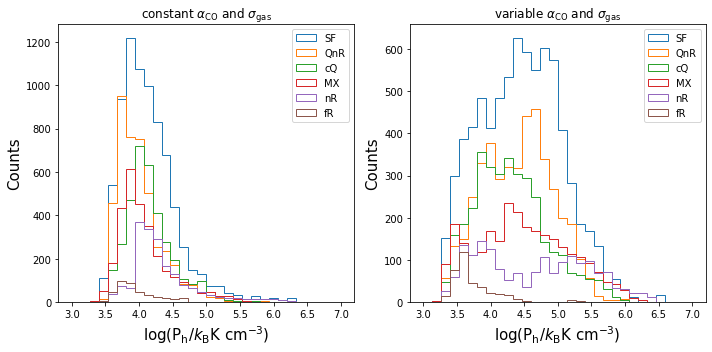

In [37]:
fig, axs = plt.subplots(1,2,figsize=(10,5))#,sharey='row')
for ax,name,title_type in zip(axs.ravel(),['log_P_h_MW','log_P_h_O3_vdisp'],['constant','variable']):
    for QS in stages:
        this_group = nonSF_byQS.get_group(QS)
        ax.hist(this_group[name],label=QS,bins=np.linspace(3.,7.,31),histtype='step')
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_ylabel('Counts',size=15)
    ax.set_title(title_type+r' $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$')
    ax.legend(loc='best')
fig.tight_layout()
plt.show()

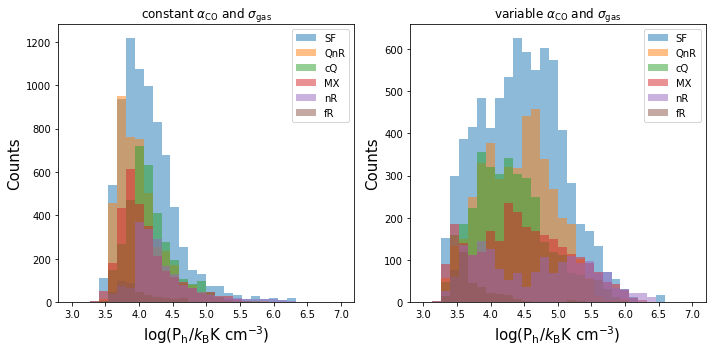

In [32]:
fig, axs = plt.subplots(1,2,figsize=(10,5))#,sharey='row')
for ax,name,title_type in zip(axs.ravel(),['log_P_h_MW','log_P_h_O3_vdisp'],['constant','variable']):
    for QS in stages:
        this_group = nonSF_byQS.get_group(QS)
        ax.hist(this_group[name],alpha=0.5,label=QS,bins=np.linspace(3.,7.,31))
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_ylabel('Counts',size=15)
    ax.set_title(title_type+r' $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$')
    ax.legend(loc='best')
fig.tight_layout()
plt.show()

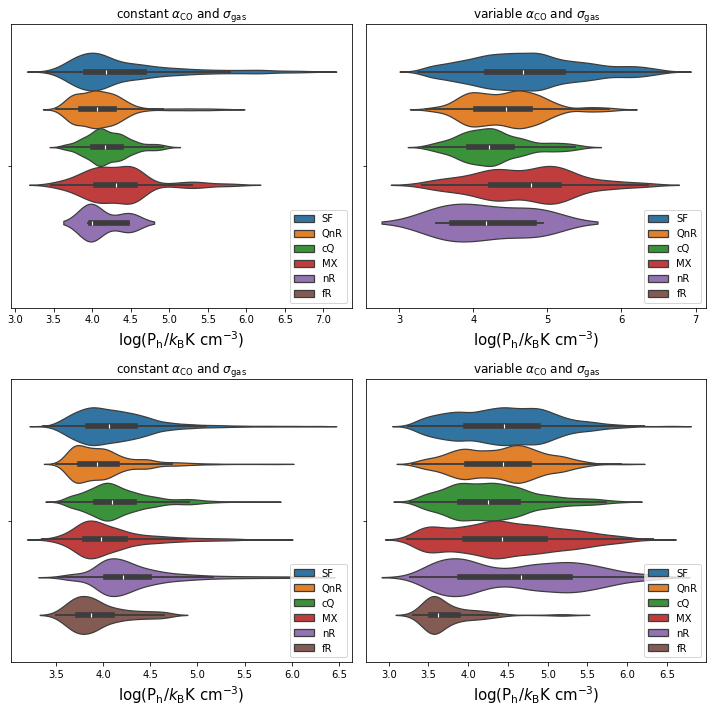

In [30]:
fig, axs = plt.subplots(2,2,figsize=(10,10))#,sharey='row')
sns.violinplot(Database_SF, x="log_P_h_MW",         hue='Final_QS',hue_order=stages,ax=axs[0,0])
sns.violinplot(Database_SF, x="log_P_h_O3_vdisp",   hue='Final_QS',hue_order=stages,ax=axs[0,1])
sns.violinplot(Database_nonSF, x="log_P_h_MW",      hue='Final_QS',hue_order=stages,ax=axs[1,0])
sns.violinplot(Database_nonSF, x="log_P_h_O3_vdisp",hue='Final_QS',hue_order=stages,ax=axs[1,1])
for ax,title_type in zip(axs.ravel(),['constant','variable','constant','variable']):
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
#    ax.set_ylabel('Counts',size=15)
    ax.set_title(title_type+r' $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$')
    ax.legend(loc='lower right')
fig.tight_layout()
plt.show()

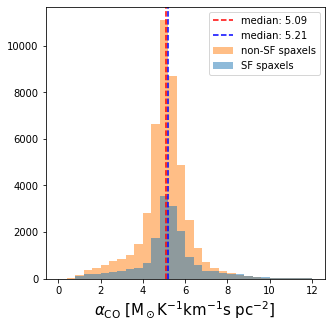

In [42]:
fig, ax = plt.subplots(figsize=(5,5))
ax.hist(Database_nonSF['alphaCO_O3N2'],alpha=0.5,label=r'non-SF spaxels',color='tab:orange',bins=np.linspace(0.,12,31))
median = np.nanmedian(Database_nonSF['alphaCO_O3N2'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.hist(Database_SF['alphaCO_O3N2'],alpha=0.5,label=r'SF spaxels',bins=np.linspace(0.,12,31))
median = np.nanmedian(Database_SF['alphaCO_O3N2'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.set_xlabel(r'$\alpha_\mathrm{CO}$ [M$_\odot$K$^{-1}$km$^{-1}$s pc$^{-2}$]',size=15)
ax.legend(loc='best')
plt.show()

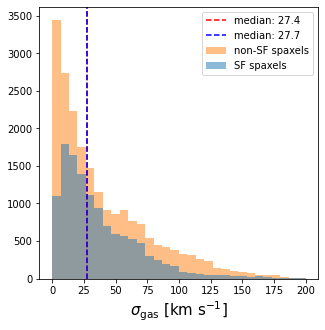

In [49]:
fig, ax = plt.subplots(figsize=(5,5))
ax.hist(Database_nonSF['CO_vdisp'],alpha=0.5,label=r'non-SF spaxels',color='tab:orange',bins=np.linspace(0.,200,31))
median = np.nanmedian(Database_nonSF['CO_vdisp'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.hist(Database_SF['CO_vdisp'],alpha=0.5,label=r'SF spaxels',bins=np.linspace(0.,200,31))
median = np.nanmedian(Database_SF['CO_vdisp'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
ax.set_xlabel(r'$\sigma_\mathrm{gas}$ [km s$^{-1}$]',size=15)
ax.legend(loc='best')
plt.show()

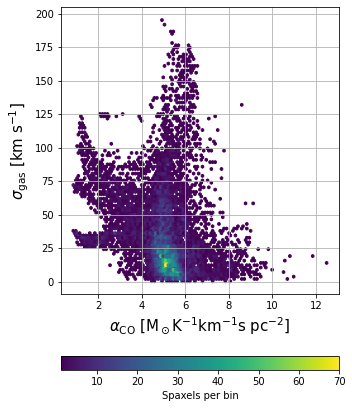

In [51]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = (Database_SF['alphaCO_O3N2']<15)&(Database_SF['CO_vdisp']<200)
im = ax.hexbin(Database_SF.loc[mask,'alphaCO_O3N2'],Database_SF.loc[mask,'CO_vdisp'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.set_ylabel(r'$\sigma_\mathrm{gas}$ [km s$^{-1}$]',size=15)
ax.set_xlabel(r'$\alpha_\mathrm{CO}$ [M$_\odot$K$^{-1}$km$^{-1}$s pc$^{-2}$]',size=15)
ax.grid(True)
#ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

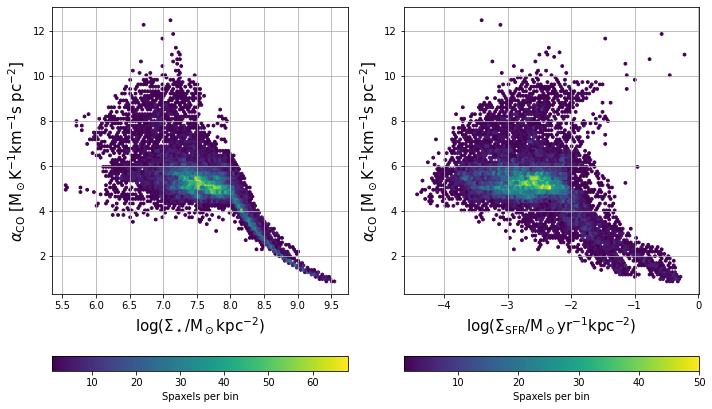

In [64]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
mask = (Database_SF['alphaCO_O3N2']<15)
for ax, name, label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR'],[r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)']):
    im = ax.hexbin(Database_SF.loc[mask,name],Database_SF.loc[mask,'alphaCO_O3N2'],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.set_ylabel(r'$\alpha_\mathrm{CO}$ [M$_\odot$K$^{-1}$km$^{-1}$s pc$^{-2}$]',size=15)
    ax.set_xlabel(label,size=15)
    ax.grid(True)
fig.tight_layout()
plt.show()

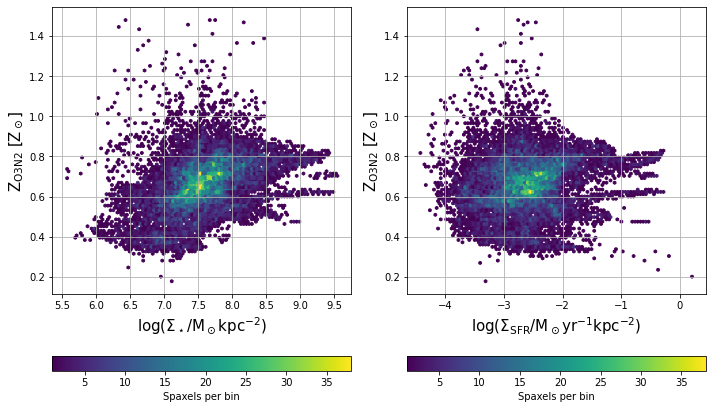

In [66]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
mask = (Database_SF['Z_O3N2']<1.5)
for ax, name, label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR'],[r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)']):
    im = ax.hexbin(Database_SF.loc[mask,name],Database_SF.loc[mask,'Z_O3N2'],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.set_ylabel(r'Z$_\mathrm{O3N2}$ [Z$_\odot$]',size=15)
    ax.set_xlabel(label,size=15)
    ax.grid(True)
fig.tight_layout()
plt.show()

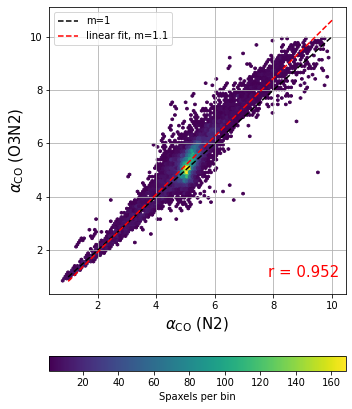

In [69]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = (Database_SF['alphaCO_O3N2']<10)&(Database_SF['alphaCO_N2']<10)
pearson = linregress(Database_SF.loc[mask,'alphaCO_N2'],Database_SF.loc[mask,'alphaCO_O3N2'])
im = ax.hexbin(Database_SF.loc[mask,'alphaCO_N2'],Database_SF.loc[mask,'alphaCO_O3N2'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([1.,10.],[1.,10.],c='k',ls='--',label='m=1')
ax.plot([1.,10.],[pearson.slope*1.+pearson.intercept,pearson.slope*10+pearson.intercept],c='r',ls='--',label='linear fit'+f', m={pearson.slope:.2}')
ax.text(7.8,1.,f'r = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'$\alpha_\mathrm{CO}$ (O3N2)',size=15)
ax.set_xlabel(r'$\alpha_\mathrm{CO}$ (N2)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

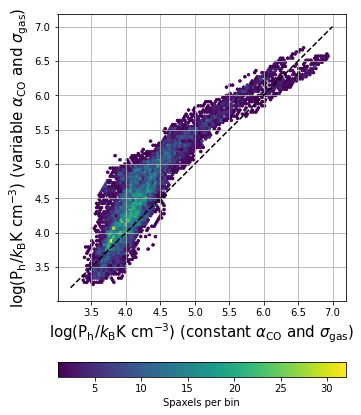

In [67]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = np.isfinite(Database_SF['log_P_h_MW'])&np.isfinite(Database_SF['log_P_h_O3_vdisp'])
im = ax.hexbin(Database_SF.loc[mask,'log_P_h_MW'],Database_SF.loc[mask,'log_P_h_O3_vdisp'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([3.2,7.],[3.2,7.],c='k',ls='--')
ax.set_ylabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (variable $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$)',size=15)
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (constant $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$)',size=15)
ax.grid(True)
fig.tight_layout()
plt.show()

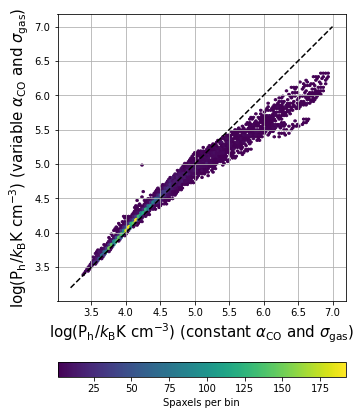

In [70]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = np.isfinite(Database_SF['log_P_h_MW'])&np.isfinite(Database_SF['log_P_h_O3'])
im = ax.hexbin(Database_SF.loc[mask,'log_P_h_MW'],Database_SF.loc[mask,'log_P_h_O3'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([3.2,7.],[3.2,7.],c='k',ls='--')
ax.set_ylabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (variable $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$)',size=15)
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (constant $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$)',size=15)
ax.grid(True)
fig.tight_layout()
plt.show()

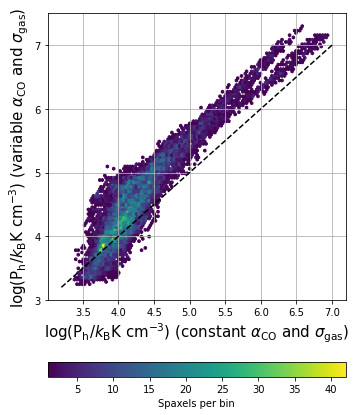

In [71]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = np.isfinite(Database_SF['log_P_h_MW'])&np.isfinite(Database_SF['log_P_h_MW_vdisp'])
im = ax.hexbin(Database_SF.loc[mask,'log_P_h_MW'],Database_SF.loc[mask,'log_P_h_MW_vdisp'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([3.2,7.],[3.2,7.],c='k',ls='--')
ax.set_ylabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (variable $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$)',size=15)
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (constant $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$)',size=15)
ax.grid(True)
fig.tight_layout()
plt.show()

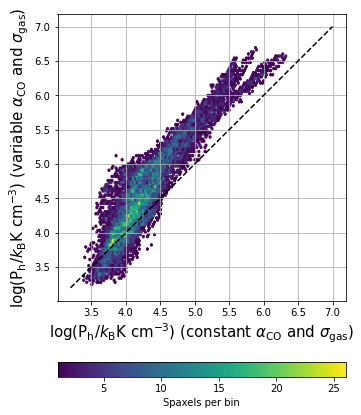

In [72]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = np.isfinite(Database_SF['log_P_h_O3'])&np.isfinite(Database_SF['log_P_h_O3_vdisp'])
im = ax.hexbin(Database_SF.loc[mask,'log_P_h_O3'],Database_SF.loc[mask,'log_P_h_O3_vdisp'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([3.2,7.],[3.2,7.],c='k',ls='--')
ax.set_ylabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (variable $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$)',size=15)
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$) (constant $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$)',size=15)
ax.grid(True)
fig.tight_layout()
plt.show()

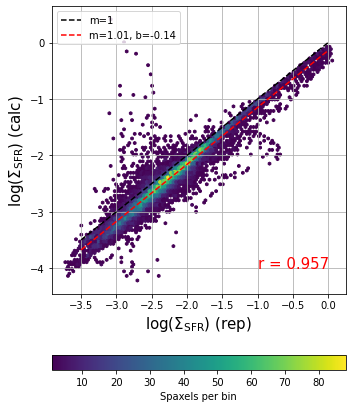

In [47]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_S_SFR2'])
pearson = linregress(Database_SF.loc[mask,'log_S_SFR2'],Database_SF.loc[mask,'log_S_SFR'])
im = ax.hexbin(Database_SF.loc[mask,'log_S_SFR2'],Database_SF.loc[mask,'log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([-3.5,0.],[-3.5,0.],c='k',ls='--',label='m=1')
ax.plot([-3.5,0.],[pearson.slope*-3.5+pearson.intercept,pearson.slope*0.+pearson.intercept],c='r',ls='--',label=f'm={pearson.slope:.3}, b={pearson.intercept:.3}')
ax.text(-1.,-4.,f'r = {pearson.rvalue:.3}',color='r',size=15)
ax.set_xlabel(r'log($\Sigma_\mathrm{SFR}$) (rep)',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$) (calc)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

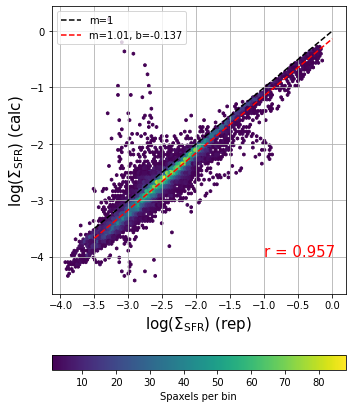

In [73]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_S_SFR2'])
pearson = linregress(Database_SF.loc[mask,'log_S_SFR2'],Database_SF.loc[mask,'log_S_SFR'])
im = ax.hexbin(Database_SF.loc[mask,'log_S_SFR2'],Database_SF.loc[mask,'log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([-3.5,0.],[-3.5,0.],c='k',ls='--',label='m=1')
ax.plot([-3.5,0.],[pearson.slope*-3.5+pearson.intercept,pearson.slope*0.+pearson.intercept],c='r',ls='--',label=f'm={pearson.slope:.3}, b={pearson.intercept:.3}')
ax.text(-1.,-4.,f'r = {pearson.rvalue:.3}',color='r',size=15)
ax.set_xlabel(r'log($\Sigma_\mathrm{SFR}$) (rep)',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$) (calc)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

# Comparing assumptions about $\alpha_\mathrm{CO}$ and $\sigma_\mathrm{gas}$

<AxesSubplot:xlabel='log_P_h_MW', ylabel='log_S_SFR'>

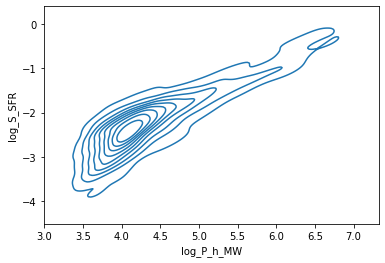

In [42]:
sns.kdeplot(Database_SF, x="log_P_h_MW",y="log_S_SFR")#,ax=ax)

In [74]:
A = 0.3
b = 0.95

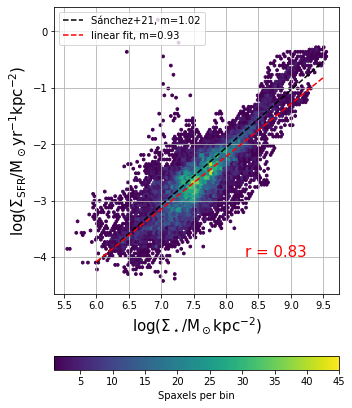

In [75]:
fig, ax = plt.subplots(1,1,figsize=(5,6))
mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_S_Mstar'])
pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR'])
im = ax.hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
ax.plot([6.,9.5],[(6.-6)*1.02-10.1+6,(9.5-6)*1.02-10.1+6],c='k',ls='--',label='Sánchez+21'+f', m=1.02')
ax.plot([6.,9.5],[6.*pearson.slope+pearson.intercept,9.5*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', m={pearson.slope:.2}')
ax.text(8.3,-4.,f'r = {pearson.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
ax.grid(True)
ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

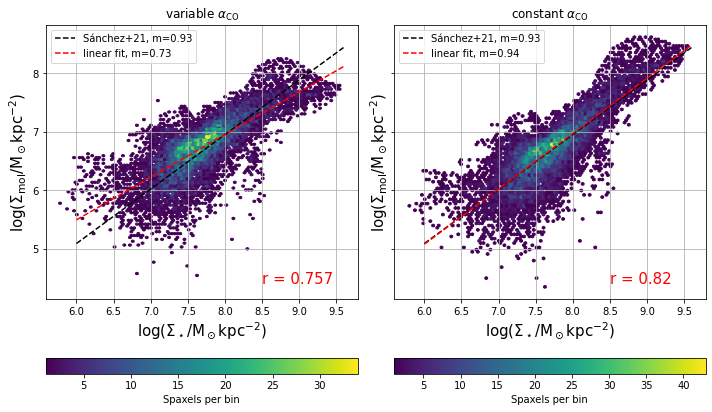

In [76]:
fig, axs = plt.subplots(1,2,figsize=(10,6),sharey='row')
for ax,name,title in zip(axs.ravel(),['log_S_mol_O3','log_S_mol_MW'],['variable','constant']):
    mask = np.isfinite(Database_SF['log_S_Mstar'])&np.isfinite(Database_SF[name])
    pearson = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,name])
    im = ax.hexbin(Database_SF['log_S_Mstar'],Database_SF[name],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    #ax.plot([6.,9.5],[6.*0.93-0.91-6.+6*0.93,9.5*0.93-0.91-6.+6*0.93],c='k',ls='--',label='Sánchez+21'+f', m=0.93')
    ax.plot([6.,9.6],[(6.-6)*0.93-0.91+6,(9.6-6)*0.93-0.91+6],c='k',ls='--',label='Sánchez+21'+f', m=0.93')
    ax.plot([6.,9.6],[6.*pearson.slope+pearson.intercept,9.6*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', m={pearson.slope:.2}')
    ax.text(8.5,4.4,f'r = {pearson.rvalue:.3}',color='r',size=15)
    ax.set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
    ax.set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
    ax.set_title(title+r' $\alpha_\mathrm{CO}$',size=12)
    ax.grid(True)
    ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

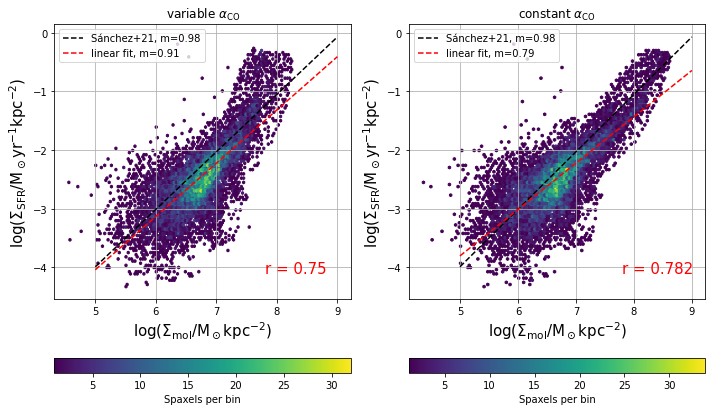

In [77]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
for ax,name,title in zip(axs.ravel(),['log_S_mol_O3','log_S_mol_MW'],['variable','constant']):
    mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF[name])
    pearson = linregress(Database_SF.loc[mask,name],Database_SF.loc[mask,'log_S_SFR'])
    im = ax.hexbin(Database_SF[name],Database_SF['log_S_SFR'],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.plot([5.,9.],[(5.-6)*0.98-9.01+6,(9.-6)*0.98-9.01+6],c='k',ls='--',label='Sánchez+21'+f', m=0.98')
    ax.plot([5.,9.],[5.*pearson.slope+pearson.intercept,9.*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', m={pearson.slope:.2}')
    ax.text(7.8,-4.1,f'r = {pearson.rvalue:.3}',color='r',size=15)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
    ax.set_title(title+r' $\alpha_\mathrm{CO}$',size=12)
    ax.grid(True)
    ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

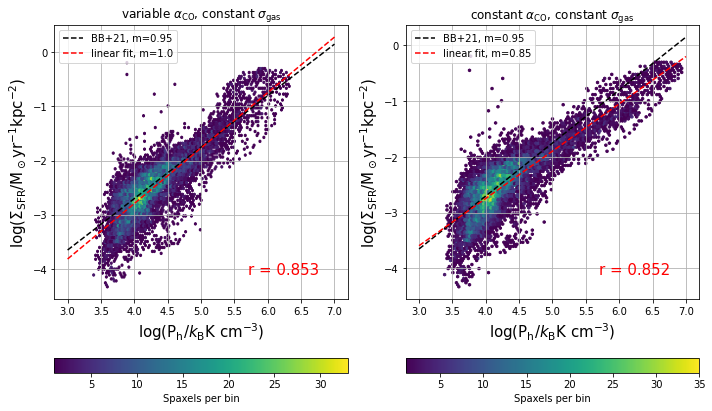

In [78]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
for ax,name,title in zip(axs.ravel(),['log_P_h_O3','log_P_h_MW'],['variable','constant']):
    mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF[name])
    pearson = linregress(Database_SF.loc[mask,name],Database_SF.loc[mask,'log_S_SFR'])
    im = ax.hexbin(Database_SF[name],Database_SF['log_S_SFR'],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.plot([3.,7.],[(3.-4)*b+A-3,(7.-4)*b+A-3],c='k',ls='--',label='BB+21'+f', m={b:.2}')
    ax.plot([3.,7.],[3.*pearson.slope+pearson.intercept,7.*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', m={pearson.slope:.2}')
    ax.text(5.7,-4.1,f'r = {pearson.rvalue:.3}',color='r',size=15)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_title(title+r' $\alpha_\mathrm{CO}$, constant $\sigma_\mathrm{gas}$',size=12)
    ax.grid(True)
    ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

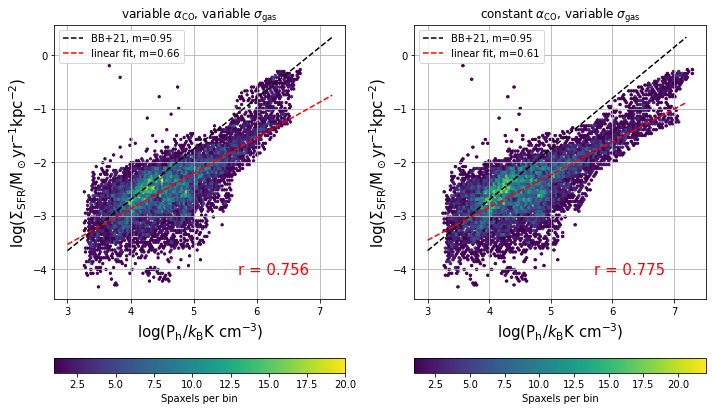

In [79]:
fig, axs = plt.subplots(1,2,figsize=(10,6))
for ax,name,title in zip(axs.ravel(),['log_P_h_O3_vdisp','log_P_h_MW_vdisp'],['variable','constant']):
    mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF[name])
    pearson = linregress(Database_SF.loc[mask,name],Database_SF.loc[mask,'log_S_SFR'])
    im = ax.hexbin(Database_SF[name],Database_SF['log_S_SFR'],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.plot([3.,7.2],[(3.-4)*b+A-3,(7.2-4)*b+A-3],c='k',ls='--',label='BB+21'+f', m={b:.2}')
    ax.plot([3.,7.2],[3.*pearson.slope+pearson.intercept,7.2*pearson.slope+pearson.intercept],c='r',ls='--',label='linear fit'+f', m={pearson.slope:.2}')
    ax.text(5.7,-4.1,f'r = {pearson.rvalue:.3}',color='r',size=15)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_title(title+r' $\alpha_\mathrm{CO}$, variable $\sigma_\mathrm{gas}$',size=12)
    ax.grid(True)
    ax.legend(loc='upper left')
fig.tight_layout()
plt.show()

# Dependence on P$_\mathrm{h}$

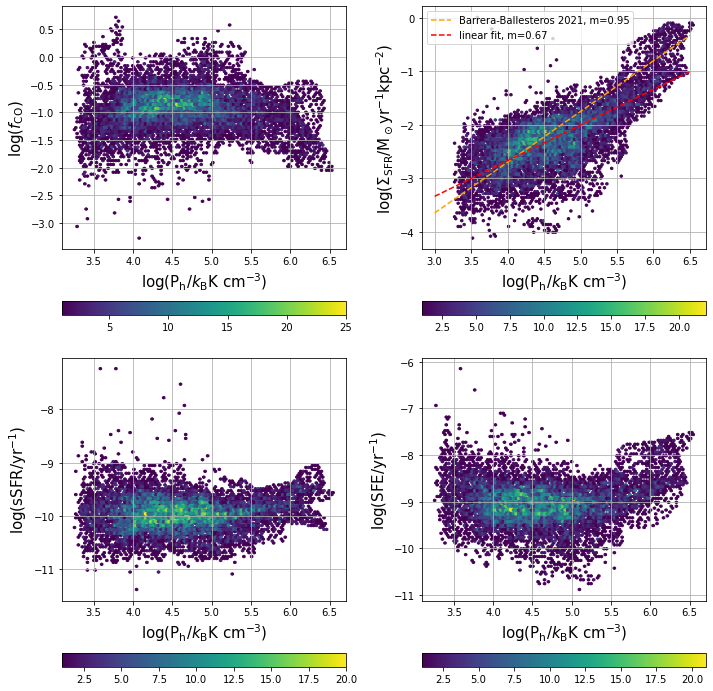

In [185]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,title,label in zip(axs.ravel(),['log_f_CO','log_S_SFR','log_sSFR','log_SFE'],
                          [r'$f_\mathrm{CO}$',r'$\Sigma_\mathrm{SFR}$','sSFR','SFE'],[r'log($f_\mathrm{CO}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database_SF.loc[CO_mask_SF,'log_P_h'],Database_SF.loc[CO_mask_SF,name],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='orange',ls='--',label='Barrera-Ballesteros 2021'+f', m={b:.2}')
axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='r',ls='--',label='linear fit'+f', m={pearson_SFR_Ph.slope:.2}')
axs[0,1].legend(loc='best')
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


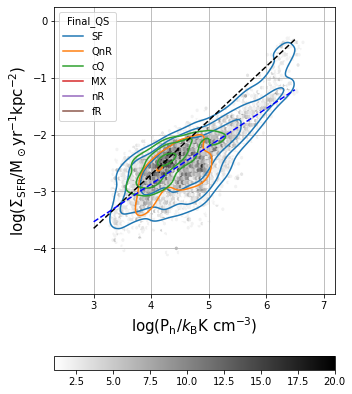

In [87]:
fig, ax = plt.subplots(figsize=(5,6))
ax.plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='Barrera-Ballesteros 2021'+f', m={b:.2}')
ax.plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', m={pearson_SFR_Ph.slope:.2}')
ax.legend(loc='best')
im = ax.hexbin(Database_SF['log_P_h_O3_vdisp'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='horizontal')
sns.kdeplot(Database_SF, x="log_P_h_O3_vdisp", y="log_S_SFR",levels=[.25,.5,.75],hue="Final_QS",hue_order=stages,ax=ax)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
ax.grid(True)
#ax.legend(loc='best')
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


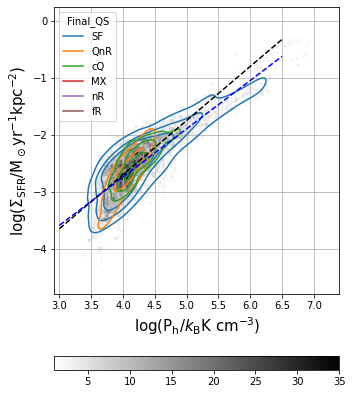

In [88]:
mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_P_h_MW'])
pearson = linregress(Database_SF.loc[mask,'log_P_h_MW'],Database_SF.loc[mask,'log_S_SFR'])
fig, ax = plt.subplots(figsize=(5,6))
ax.plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='Barrera-Ballesteros 2021'+f', m={b:.2}')
ax.plot([3.,6.5],[pearson.slope*3.+pearson.intercept,pearson.slope*6.5+pearson.intercept],c='b',ls='--',label='linear fit'+f', m={pearson.slope:.2}')
ax.legend(loc='best')
im = ax.hexbin(Database_SF['log_P_h_MW'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='horizontal')
sns.kdeplot(Database_SF, x="log_P_h_MW", y="log_S_SFR",levels=[.25,.5,.75],hue="Final_QS",hue_order=stages,ax=ax)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
ax.grid(True)
#ax.legend(loc='best')
fig.tight_layout()
plt.show()

In [294]:
scale1_sources = np.array(['IC1528', 'MCG-01-01-012', 'MCG-02-02-030', 'NGC2449', 'NGC3300', 'NGC7364', 'UGC01368', 'UGC04240', 'UGC04455', 'UGC05396', 'UGC11680NED02', 'UGC11982', 'VV488NED02'])
scale125_sources = np.array(['IC2341', 'NGC2554', 'NGC2595', 'NGC7025', 'NGC7625', 'NGC7716', 'UGC11792', 'UGC12348'])
scale15_sources = np.array(['CGCG429-012', 'IC1079', 'MCG-01-10-015', 'MCG-01-52-012', 'MCG-02-51-004', 'NGC0001', 'NGC0155', 'NGC0169', 'NGC0171', 'NGC0180', 'NGC0693', 'NGC0731', 'NGC0768', 'NGC0955', 'NGC1056', 'NGC1542', 'NGC2540', 'NGC6427', 'NGC7194', 'NGC7311', 'NGC7321', 'NGC7466', 'NGC7489', 'UGC00312', 'UGC00335NED02', 'UGC01123', 'UGC01938', 'UGC02099', 'UGC04245', 'UGC08322', 'UGC08781', 'UGC10972', 'UGC11649', 'UGC11958', 'UGC12224', 'UGC12250', 'UGC12274'])

In [301]:
Database_SF_1 = Database_SF[np.isin(Database_SF['Source'],scale1_sources)].copy()
Database_SF_125 = Database_SF[np.isin(Database_SF['Source'],scale125_sources)].copy()
Database_SF_15 = Database_SF[np.isin(Database_SF['Source'],scale15_sources)].copy()

In [307]:
mask = np.isfinite(Database_SF_1['log_S_SFR'])&np.isfinite(Database_SF_1['log_P_h'])
pearson_SFR_Ph_1 = linregress(Database_SF_1.loc[mask,'log_P_h'],Database_SF_1.loc[mask,'log_S_SFR'])
mask = np.isfinite(Database_SF_125['log_S_SFR'])&np.isfinite(Database_SF_125['log_P_h'])
pearson_SFR_Ph_125 = linregress(Database_SF_125.loc[mask,'log_P_h'],Database_SF_125.loc[mask,'log_S_SFR'])
mask = np.isfinite(Database_SF_15['log_S_SFR'])&np.isfinite(Database_SF_15['log_P_h'])
pearson_SFR_Ph_15 = linregress(Database_SF_15.loc[mask,'log_P_h'],Database_SF_15.loc[mask,'log_S_SFR'])

In [257]:
scale_sources = ['IC1528','IC2341','MCG-01-01-012','MCG-02-02-030','NGC2449','NGC2554','NGC2595','NGC3300',
 'NGC7025','NGC7364','NGC7625','NGC7716','UGC01368','UGC04240','UGC04455','UGC05396',
 'UGC11680NED02','UGC11792','UGC11982','UGC12348','VV488NED02']

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


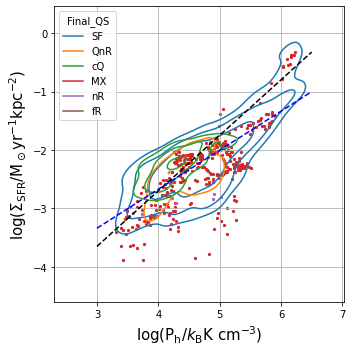

In [323]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='Barrera-Ballesteros 2021'+f', m={b:.2}')
ax.plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', m={pearson_SFR_Ph.slope:.2}')
ax.legend(loc='best')
#im = ax.hexbin(Database_SF['log_P_h'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
#fig.colorbar(im,ax=ax,orientation='horizontal')
for name,color in zip(['MX','nR','fR'],['#d62728','#9467bd','#8c564b']):
    this_group = SF_byQS.get_group(name)
    ax.scatter(this_group['log_P_h'],this_group['log_S_SFR'],s=5,alpha=1,c=color)
sns.kdeplot(Database_SF, x="log_P_h", y="log_S_SFR",levels=[.25,.5,.75],hue="Final_QS",hue_order=['SF','QnR','cQ','MX','nR','fR'],ax=ax)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
ax.grid(True)
fig.tight_layout()
plt.show()

In [267]:
print(Database_SF[['S_mol_O3N2','S_Mstar','CO_vdisp','Re_kpc']].median())

S_mol_O3N2    6.448004e+06
S_Mstar       3.580253e+07
CO_vdisp      2.765549e+01
Re_kpc        4.121280e+00
dtype: float64


In [274]:
rng = np.random.default_rng()

In [292]:
hs = 4.121280e+00/(1.68*7.3)
star_vdisp = np.sqrt(2*np.pi*G*3.580253e+07*hs)*u.kpc.to(u.km) # stellar velocity dispersion in km s^-1
Ph = (np.pi*G/2)*(6.448004e+06+S_H1)*((6.448004e+06+S_H1)+3.580253e+07*2.765549e+01/star_vdisp)
Ph = Ph/k_B/(u.kpc**3).to(u.cm**3)
S_H1_arr = (rng.standard_normal(1000)*2+7)*10**6
Ph_arr = (np.pi*G/2)*(6.448004e+06+S_H1_arr)*((6.448004e+06+S_H1_arr)+3.580253e+07*2.765549e+01/star_vdisp)
Ph_arr = Ph_arr/k_B/(u.kpc**3).to(u.cm**3)
print(Ph)

30444.739151415717


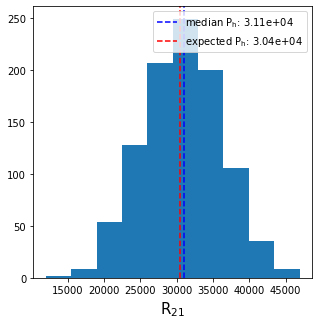

In [293]:
fig, ax = plt.subplots(figsize=(5,5))
ax.hist(Ph_arr)#,bins=np.linspace(-3,17,31),alpha=0.5,label=r'all spaxels')
median = np.nanmedian(Ph_arr)
ax.axvline(median,ls='--',c='b',label=r'median P$_\mathrm{h}$: '+f'{median:.3}')
ax.axvline(Ph,ls='--',c='r',label=r'expected P$_\mathrm{h}$: '+f'{Ph:.3}')
ax.set_xlabel(r'R$_\mathrm{21}$',size=15)
ax.legend(loc='best')
plt.show()

In [46]:
Ph_binwidth = 0.5
SF_byPh = Database_SF.groupby(create_bins(Database_SF.loc[CO_mask_SF,'log_P_h'],Ph_binwidth))
SF_byPh_median = SF_byPh[['log_S_Mstar','log_S_SFR','R_21','Z_O3N2','Z_N2','alphaCO_O3N2','alphaCO_N2','log_S_mol_O3N2','CO_vdisp','star_vdisp','log_f_CO','log_sSFR','log_SFE','log_P_h']].median()

In [47]:
Ph_binwidth = 0.5
SF_byPh_QS = Database_SF.groupby([Database_SF.loc[:,'Final_QS'],create_bins(Database_SF.loc[CO_mask_SF,'log_P_h'],Ph_binwidth)])
SF_byPh_QS_median = SF_byPh_QS[['log_S_Mstar','log_S_SFR','R_21','Z_O3N2','Z_N2','alphaCO_O3N2','alphaCO_N2','log_S_mol_O3N2','CO_vdisp','star_vdisp','log_f_CO','log_sSFR','log_SFE','log_P_h']].median()

In [237]:
Ph_binwidth = 0.5
total_byPh = Database.groupby(create_bins(Database['log_P_h'],Ph_binwidth))
total_byPh_median = total_byPh[['log_S_Mstar','log_S_SFR','R_21','Z_O3N2','Z_N2','alphaCO_O3N2','alphaCO_N2','log_S_mol_O3N2','CO_vdisp','star_vdisp','log_f_CO','log_sSFR','log_SFE','log_P_h']].median()

In [239]:
Ph_binwidth = 0.5
total_byPh_QS = Database.groupby([Database.loc[:,'Final_QS'],create_bins(Database['log_P_h'],Ph_binwidth)])
total_byPh_QS_median = total_byPh_QS[['log_S_Mstar','log_S_SFR','R_21','Z_O3N2','Z_N2','alphaCO_O3N2','alphaCO_N2','log_S_mol_O3N2','CO_vdisp','star_vdisp','log_f_CO','log_sSFR','log_SFE','log_P_h']].median()

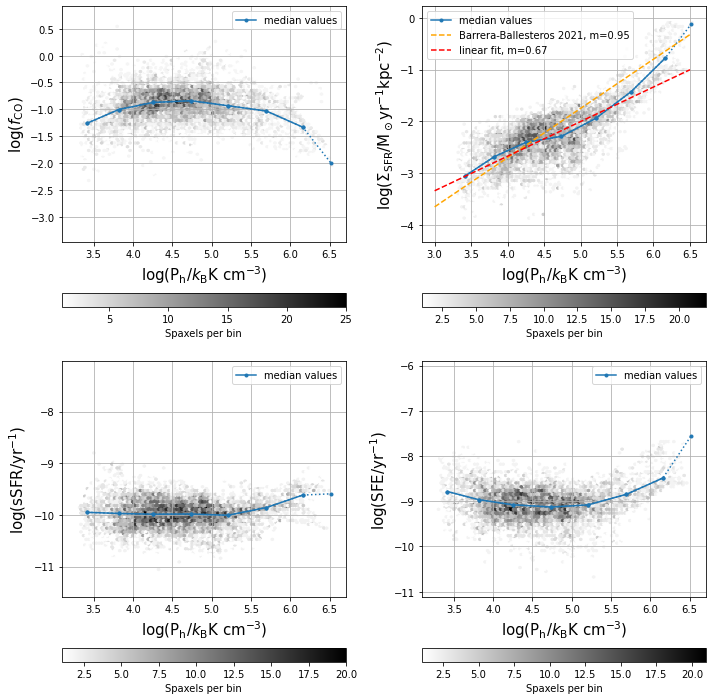

In [108]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_f_CO','log_S_SFR','log_sSFR','log_SFE'],
                               [r'log($f_\mathrm{CO}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database_SF.loc[CO_mask_SF,'log_P_h'],Database_SF.loc[CO_mask_SF,name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    ax.plot(SF_byPh_median['log_P_h'].to_numpy(),SF_byPh_median[name].to_numpy(),marker='.',ls=':',c='tab:blue')#,label='median values')
    count_mask = SF_byPh.count()['Source']>=100
    ax.plot(SF_byPh_median.loc[count_mask,'log_P_h'].to_numpy(),SF_byPh_median.loc[count_mask,name].to_numpy(),marker='.',label='median values')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.legend(loc='best')
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='orange',ls='--',label='Barrera-Ballesteros 2021'+f', m={b:.2}')
axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='r',ls='--',label='linear fit'+f', m={pearson_SFR_Ph.slope:.2}')
axs[0,1].legend(loc='best')
fig.tight_layout()
plt.show()

In [250]:
a = []

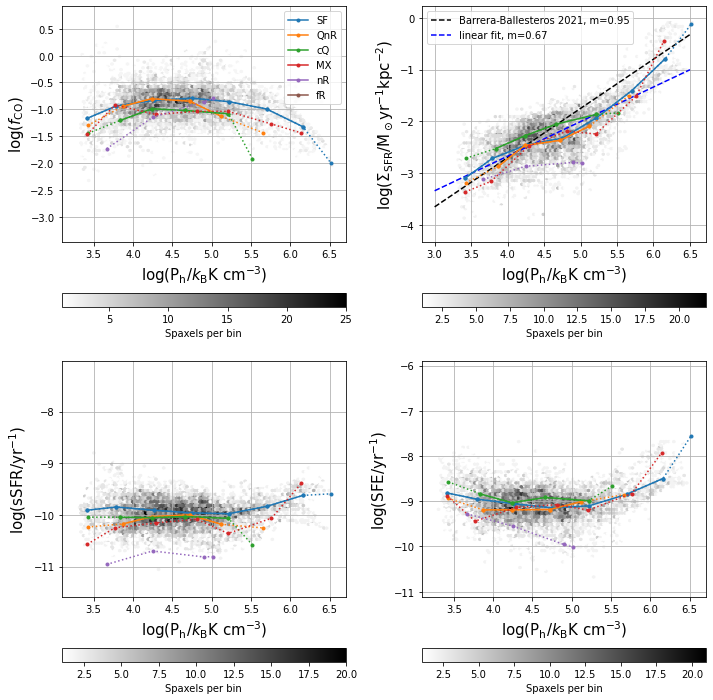

In [251]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='Barrera-Ballesteros 2021'+f', m={b:.2}')
axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', m={pearson_SFR_Ph.slope:.2}')
axs[0,1].legend(loc='best')
for ax,name,label in zip(axs.ravel(),['log_f_CO','log_S_SFR','log_sSFR','log_SFE'],
                               [r'log($f_\mathrm{CO}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database_SF.loc[CO_mask_SF,'log_P_h'],Database_SF.loc[CO_mask_SF,name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(SF_byPh_QS_median.loc[(QS,),'log_P_h'].to_numpy(),
                    SF_byPh_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = SF_byPh_QS.count().loc[(QS,),'Source']>=100
            ax.plot(SF_byPh_QS_median.loc[(QS,),'log_P_h'][count_mask].to_numpy(),
                    SF_byPh_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    a.append(ax.get_ylim())
axs[0,0].legend(loc='best')
fig.tight_layout()
plt.show()

In [252]:
a

[(-3.4719693034498906, 0.9196366442357873),
 (-4.32803674074123, 0.220749104497311),
 (-11.591211343187538, -7.029288030794044),
 (-11.120960880033207, -5.907999861933233)]

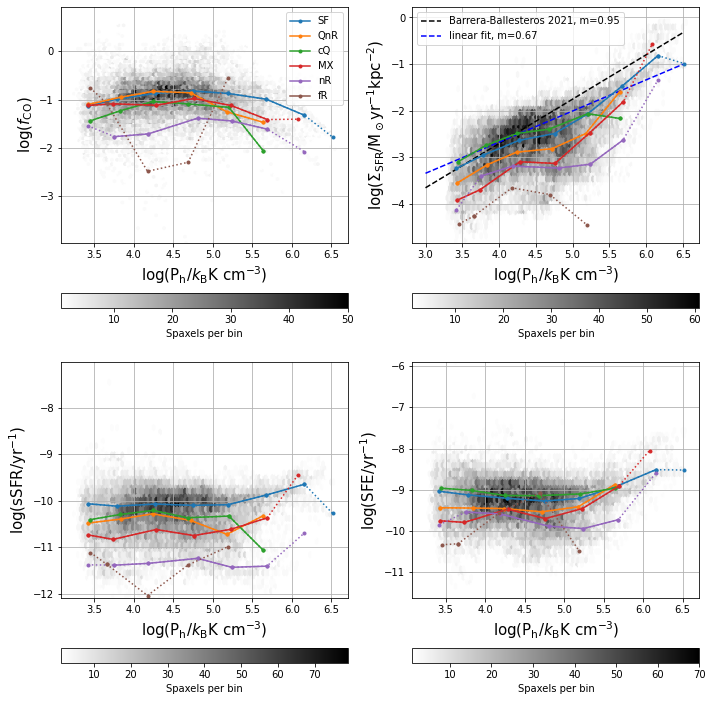

In [256]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='Barrera-Ballesteros 2021'+f', m={b:.2}')
axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', m={pearson_SFR_Ph.slope:.2}')
axs[0,1].legend(loc='best')
for ax,name,label,i in zip(axs.ravel(),['log_f_CO','log_S_SFR','log_sSFR','log_SFE'],
                               [r'log($f_\mathrm{CO}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)'],np.arange(4)):
    im = ax.hexbin(Database['log_P_h'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal',label=r'Spaxels per bin')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h'].to_numpy(),
                    total_byPh_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = total_byPh_QS.count().loc[(QS,),'Source']>=100
            ax.plot(total_byPh_QS_median.loc[(QS,),'log_P_h'][count_mask].to_numpy(),
                    total_byPh_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.set_ylim(ymin=a[i][0]-0.5,ymax=a[i][1])
axs[0,0].legend(loc='best')
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


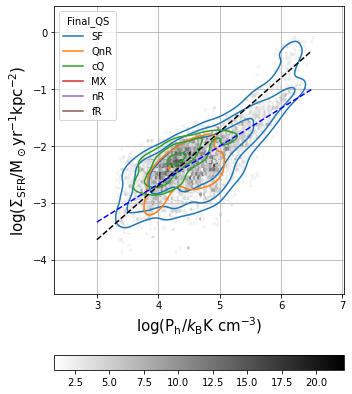

In [204]:
fig, ax = plt.subplots(figsize=(5,6))
ax.plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='Barrera-Ballesteros 2021'+f', m={b:.2}')
ax.plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', m={pearson_SFR_Ph.slope:.2}')
ax.legend(loc='best')
#for ax,frame,title,label in zip(axs.ravel(),[Database_SF['log_f_CO'],Database_SF['log_S_SFR'],Database_SF['log_sSFR'],Database_SF['log_SFE']],
#                          [r'$f_\mathrm{CO}$',r'$\Sigma_\mathrm{SFR}$','sSFR','SFE'],[r'log($f_\mathrm{CO}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
im = ax.hexbin(Database_SF['log_P_h'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='horizontal')
#sns.displot(Database_SF, x="log_P_h", y="log_S_SFR", kind="kde",levels=[.25,.5,.75],hue="Final_QS")
sns.kdeplot(Database_SF, x="log_P_h", y="log_S_SFR",levels=[.25,.5,.75],hue="Final_QS",hue_order=['SF','QnR','cQ','MX','nR','fR'],ax=ax)
#ax.plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='orange',ls='--',label='Barrera-Ballesteros 2021')
#ax.plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='r',ls='--',label='linear fit')
#ax.text(5.7,-4.1,f'r = {pearson_SFR_Ph.rvalue:.3}',color='r',size=15)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
ax.grid(True)
#ax.legend(loc='best')
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


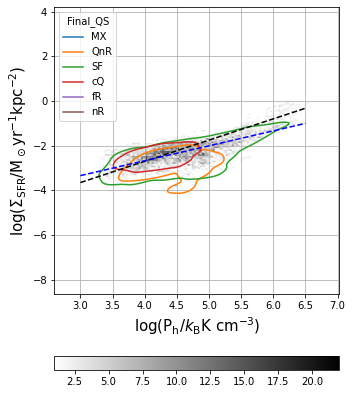

In [189]:
fig, ax = plt.subplots(figsize=(5,6))
ax.plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='Barrera-Ballesteros 2021'+f', m={b:.2}')
ax.plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', m={pearson_SFR_Ph.slope:.2}')
ax.legend(loc='best')
im = ax.hexbin(Database_SF['log_P_h'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=ax,orientation='horizontal')
#sns.displot(Database, x="log_P_h", y="log_S_SFR", kind="kde",levels=[.25,.5,.75],hue="Final_QS")
sns.kdeplot(Database, x="log_P_h", y="log_S_SFR",levels=[.35],hue="Final_QS",hue_order=['SF','QnR','cQ','MX','nR','fR'],ax=ax)
ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
ax.grid(True)
#ax.legend(loc='best')
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


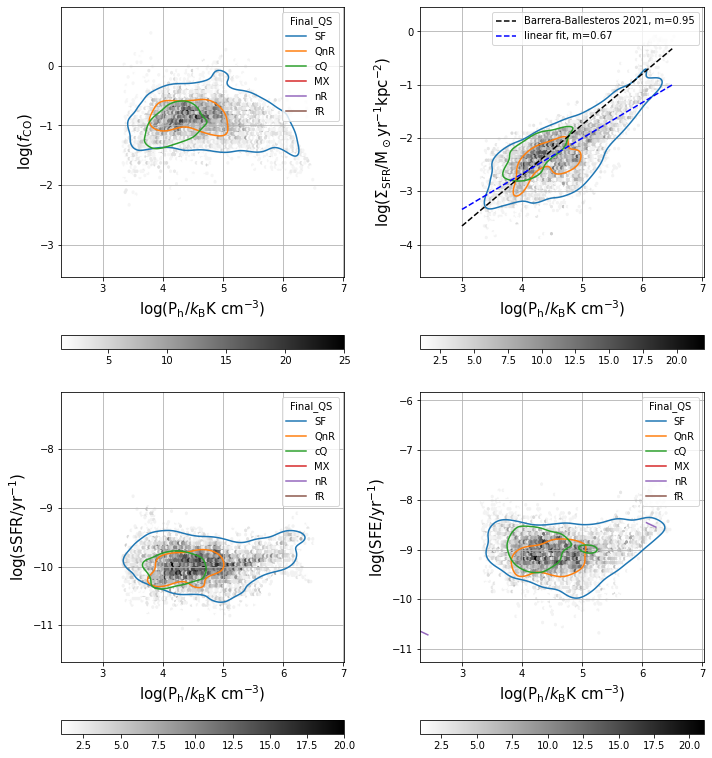

In [210]:
fig, axs = plt.subplots(2,2,figsize=(10,11))
for ax,name,title,label in zip(axs.ravel(),['log_f_CO','log_S_SFR','log_sSFR','log_SFE'],
                          [r'$f_\mathrm{CO}$',r'$\Sigma_\mathrm{SFR}$','sSFR','SFE'],[r'log($f_\mathrm{CO}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database_SF.loc[CO_mask_SF,'log_P_h'],Database_SF.loc[CO_mask_SF,name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    sns.kdeplot(Database_SF, x="log_P_h", y=name,levels=[.35],hue="Final_QS",hue_order=['SF','QnR','cQ','MX','nR','fR'],ax=ax)
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='Barrera-Ballesteros 2021'+f', m={b:.2}')
axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', m={pearson_SFR_Ph.slope:.2}')
axs[0,1].legend(loc='best')
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


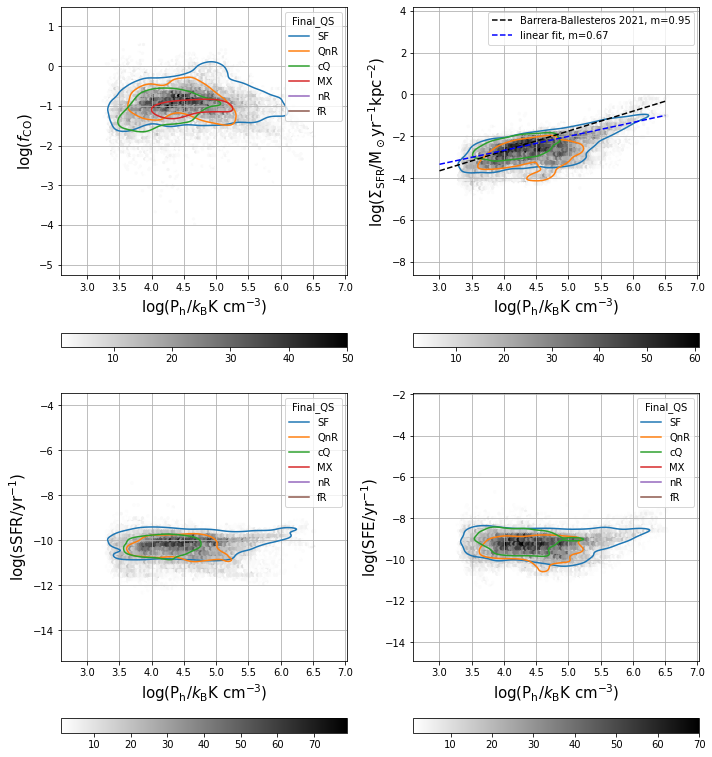

In [242]:
fig, axs = plt.subplots(2,2,figsize=(10,11))
for ax,name,title,label in zip(axs.ravel(),['log_f_CO','log_S_SFR','log_sSFR','log_SFE'],
                          [r'$f_\mathrm{CO}$',r'$\Sigma_\mathrm{SFR}$','sSFR','SFE'],[r'log($f_\mathrm{CO}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database['log_P_h'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    sns.kdeplot(Database, x="log_P_h", y=name,levels=[.35],hue="Final_QS",hue_order=['SF','QnR','cQ','MX','nR','fR'],ax=ax)
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='Barrera-Ballesteros 2021'+f', m={b:.2}')
axs[0,1].plot([3.,6.5],[pearson_SFR_Ph.slope*3.+pearson_SFR_Ph.intercept,pearson_SFR_Ph.slope*6.5+pearson_SFR_Ph.intercept],c='b',ls='--',label='linear fit'+f', m={pearson_SFR_Ph.slope:.2}')
axs[0,1].legend(loc='best')
fig.tight_layout()
plt.show()

# Dependence on R$_{gal}$/R$_{e}$

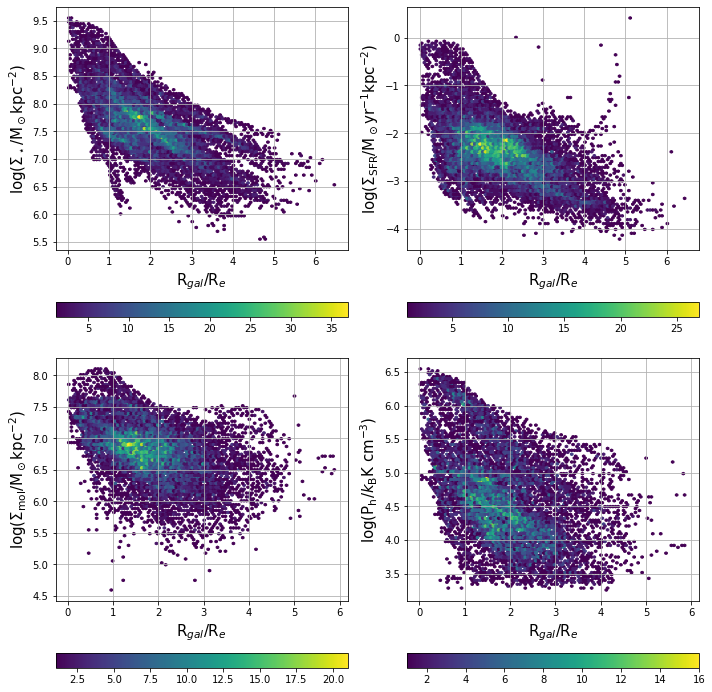

In [81]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,frame,label in zip(axs.ravel(),[Database_SF['log_S_Mstar'],Database_SF['log_S_SFR'],Database_SF['log_S_mol_O3N2'],Database_SF['log_P_h']],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database_SF['Rgal_Re'],frame,mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

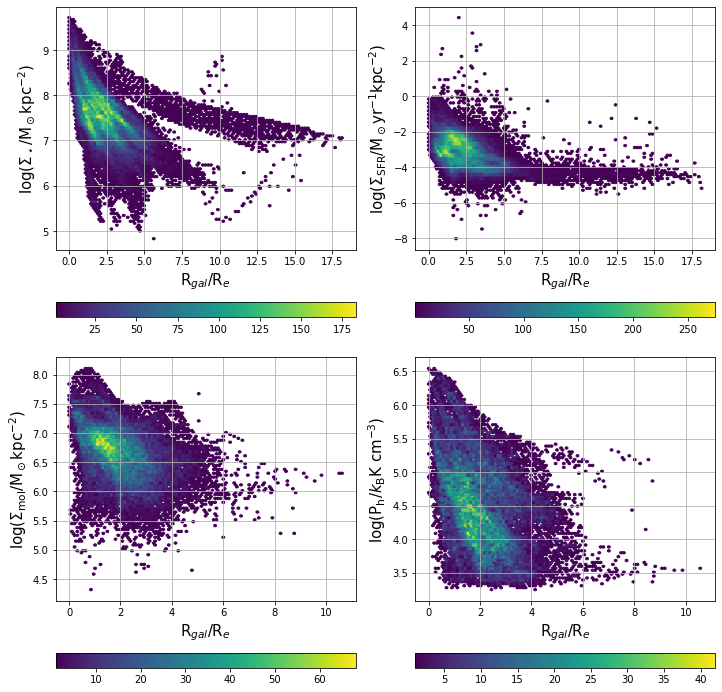

In [82]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,frame,label in zip(axs.ravel(),[Database['log_S_Mstar'],Database['log_S_SFR'],Database['log_S_mol_O3N2'],Database['log_P_h']],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database['Rgal_Re'],frame,mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

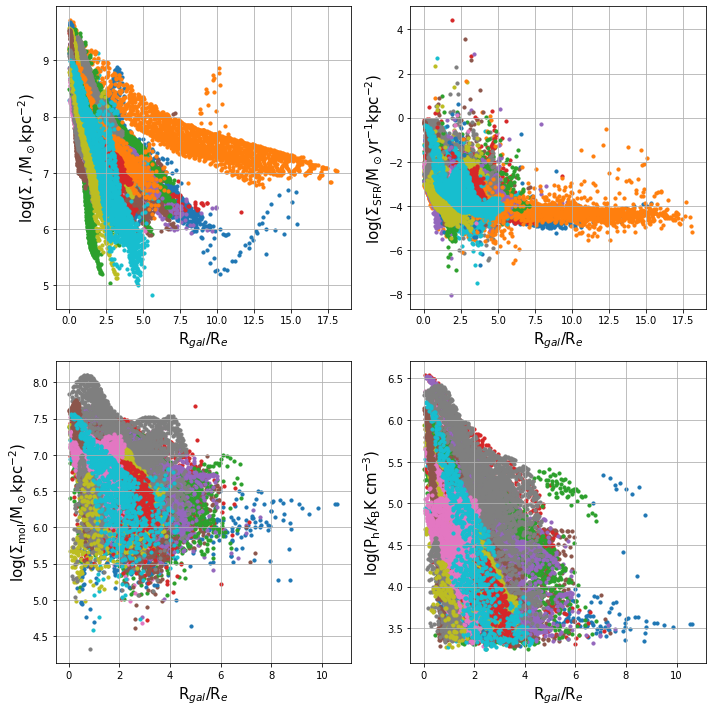

In [261]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for name in total_bysource.groups:
    try:
        this_group = total_bysource.get_group(name)
        for ax,frame,label in zip(axs.ravel(),[this_group['log_S_Mstar'],this_group['log_S_SFR'],this_group['log_S_mol_O3N2'],this_group['log_P_h']],
                                  [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
            im = ax.scatter(this_group['Rgal_Re'],frame,s=10,label=name)
            ax.set_ylabel(label,size=15)
            ax.grid(True)
            ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)
    except: a='h'#print('Could not find source '+name)
#axs[1,1].legend(loc='upper right')
fig.tight_layout()
plt.show()

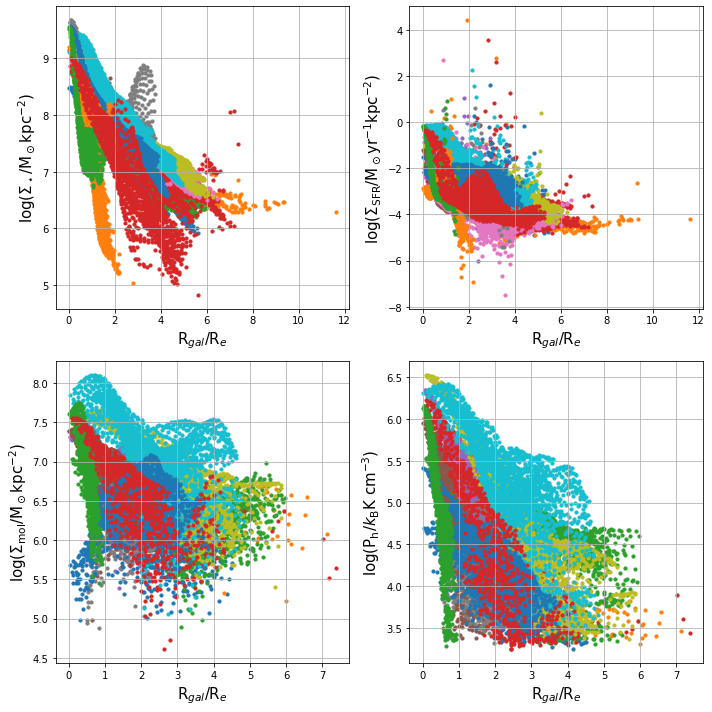

In [262]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for name in scale_sources:
    try:
        this_group = total_bysource.get_group(name)
        for ax,frame,label in zip(axs.ravel(),[this_group['log_S_Mstar'],this_group['log_S_SFR'],this_group['log_S_mol_O3N2'],this_group['log_P_h']],
                                  [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
            im = ax.scatter(this_group['Rgal_Re'],frame,s=10,label=name)
            ax.set_ylabel(label,size=15)
            ax.grid(True)
            ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)
    except: a='h'#print('Could not find source '+name)
#axs[1,1].legend(loc='upper right')
fig.tight_layout()
plt.show()

In [175]:
this_group = total_bysource.get_group('NGC7194')
this_group[np.isfinite(this_group['S_mol_O3N2'])]

,Source,Final_QS,Final_NA,Inclination,PA,Re_kpc,RA,DEC,Rgal_kpc,T_gal,...,P_h,P_DE,Rgal_Re,log_S_Mstar,log_S_mol_O3N2,log_P_h,log_f_CO,log_S_SFR,log_sSFR,log_SFE


In [84]:
Rgal_binwidth = 1.
SF_byRgal = Database_SF.groupby(create_bins(Database_SF.loc[:,'Rgal_Re'],Rgal_binwidth))
SF_byRgal_median = SF_byRgal[['Rgal_Re','log_S_Mstar','log_S_SFR','R_21','Z_O3N2','Z_N2','alphaCO_O3N2','alphaCO_N2','log_S_mol_O3N2','CO_vdisp','star_vdisp','log_f_CO','log_sSFR','log_SFE','log_P_h']].median()

In [85]:
Rgal_binwidth = 1.
SF_byRgal_QS = Database_SF.groupby([Database_SF.loc[:,'Final_QS'],create_bins(Database_SF.loc[:,'Rgal_Re'],Rgal_binwidth)])
SF_byRgal_QS_median = SF_byRgal_QS[['Rgal_Re','log_S_Mstar','log_S_SFR','R_21','Z_O3N2','Z_N2','alphaCO_O3N2','alphaCO_N2','log_S_mol_O3N2','CO_vdisp','star_vdisp','log_f_CO','log_sSFR','log_SFE','log_P_h']].median()

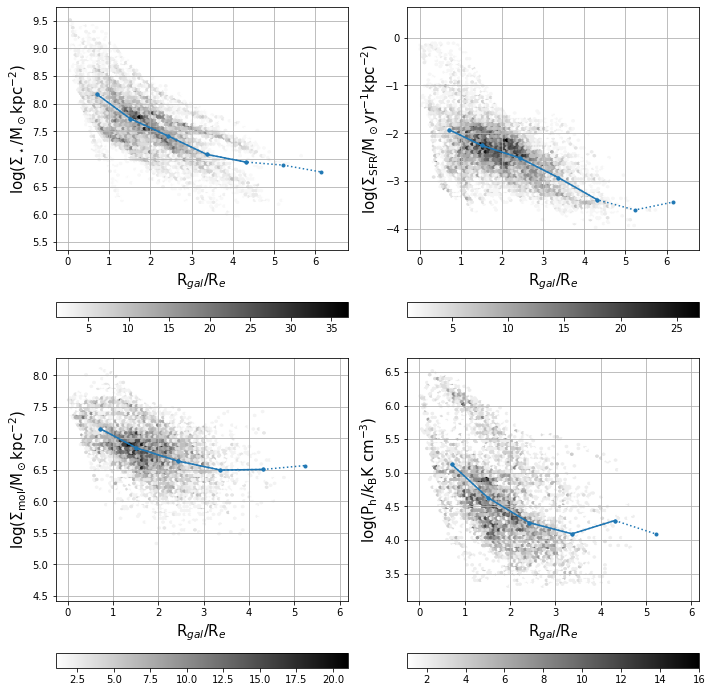

In [107]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR','log_S_mol_O3N2','log_P_h'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database_SF['Rgal_Re'],Database_SF[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.plot(SF_byRgal_median['Rgal_Re'].to_numpy(),SF_byRgal_median[name].to_numpy(),marker='.',ls=':',c='tab:blue',label='median values')
    ax.plot(SF_byRgal_median.loc[SF_byRgal.count()['Source']>=100,'Rgal_Re'].to_numpy(),SF_byRgal_median.loc[SF_byRgal.count()['Source']>=100,name].to_numpy(),marker='.',label='median values')
    
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


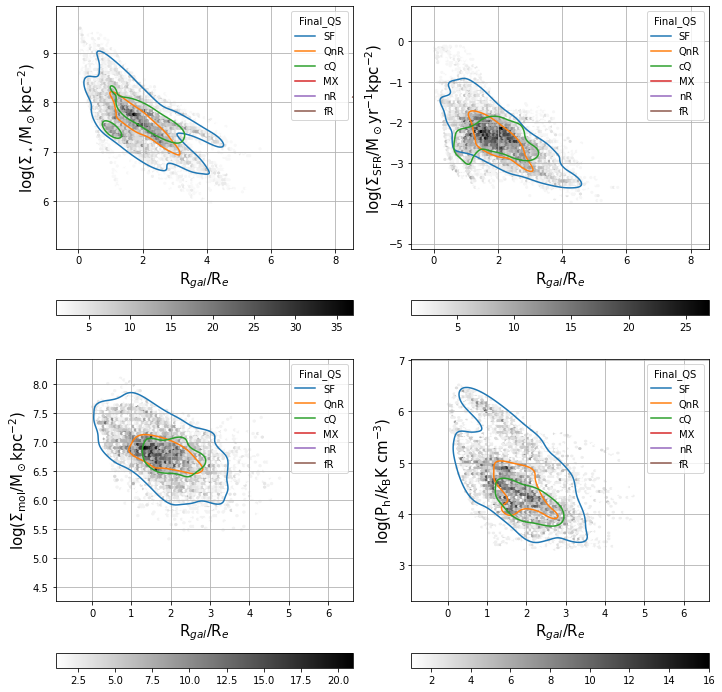

In [211]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR','log_S_mol_O3N2','log_P_h'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database_SF['Rgal_Re'],Database_SF[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    sns.kdeplot(Database_SF, x="Rgal_Re", y=name,levels=[.35],hue_order=['SF','QnR','cQ','MX','nR','fR'],hue="Final_QS",ax=ax)
    #ax.plot(SF_byRgal_median['Rgal_Re'].to_numpy(),SF_byRgal_median[name].to_numpy(),marker='.',ls=':',c='tab:blue',label='median values')
    #ax.plot(SF_byRgal_median.loc[SF_byRgal.count()['Source']>=100,'Rgal_Re'].to_numpy(),SF_byRgal_median.loc[SF_byRgal.count()['Source']>=100,name].to_numpy(),marker='.',label='median values')
    
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


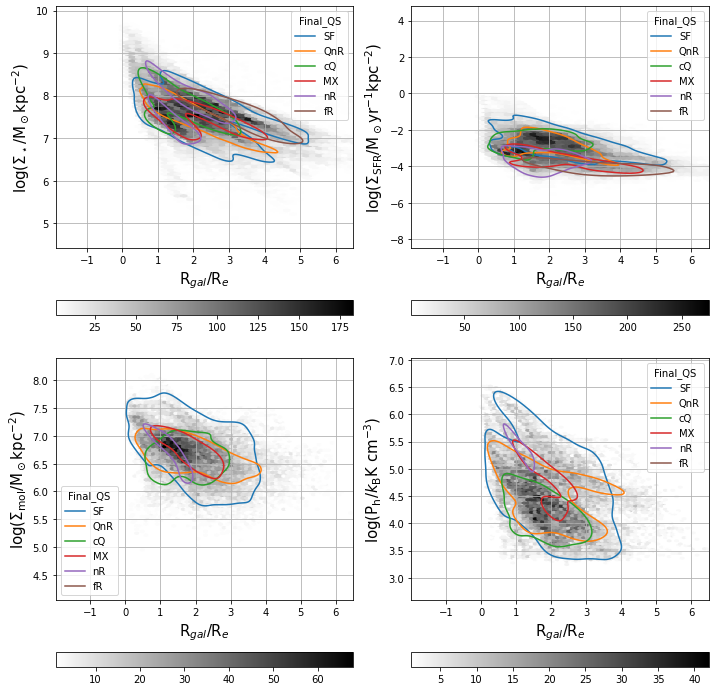

In [220]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR','log_S_mol_O3N2','log_P_h'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database['Rgal_Re'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    sns.kdeplot(Database, x="Rgal_Re", y=name,levels=[.35],hue="Final_QS",hue_order=['SF','QnR','cQ','MX','nR','fR'],ax=ax)
    #ax.plot(SF_byRgal_median['Rgal_Re'].to_numpy(),SF_byRgal_median[name].to_numpy(),marker='.',ls=':',c='tab:blue',label='median values')
    #ax.plot(SF_byRgal_median.loc[SF_byRgal.count()['Source']>=100,'Rgal_Re'].to_numpy(),SF_byRgal_median.loc[SF_byRgal.count()['Source']>=100,name].to_numpy(),marker='.',label='median values')
    ax.set_xlim(xmax=6.5)
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

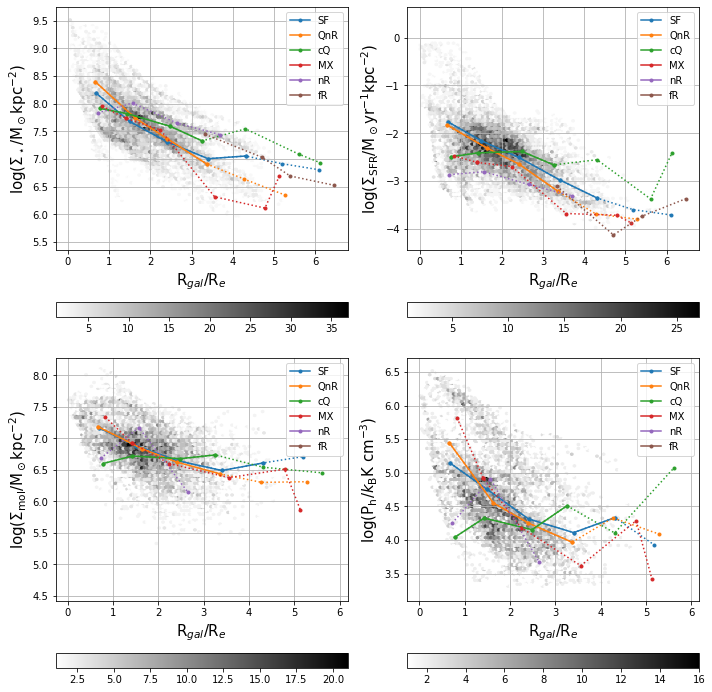

In [206]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR','log_S_mol_O3N2','log_P_h'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database_SF['Rgal_Re'],Database_SF[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(SF_byRgal_QS_median.loc[(QS,),'Rgal_Re'].to_numpy(),
                    SF_byRgal_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = SF_byRgal_QS.count().loc[(QS,),'Source']>=100
            ax.plot(SF_byRgal_QS_median.loc[(QS,),'Rgal_Re'][count_mask].to_numpy(),
                    SF_byRgal_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.legend(loc='best')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

In [123]:
Rgal_binwidth = 1.
total_byRgal = Database.groupby(create_bins(Database.loc[:,'Rgal_Re'],Rgal_binwidth))
total_byRgal_median = total_byRgal[['Rgal_Re','log_S_Mstar','log_S_SFR','R_21','Z_O3N2','Z_N2','alphaCO_O3N2','alphaCO_N2','log_S_mol_O3N2','CO_vdisp','star_vdisp','log_f_CO','log_sSFR','log_SFE','log_P_h']].median()

In [124]:
Rgal_binwidth = 1.
total_byRgal_QS = Database.groupby([Database.loc[:,'Final_QS'],create_bins(Database.loc[:,'Rgal_Re'],Rgal_binwidth)])
total_byRgal_QS_median = total_byRgal_QS[['Rgal_Re','log_S_Mstar','log_S_SFR','R_21','Z_O3N2','Z_N2','alphaCO_O3N2','alphaCO_N2','log_S_mol_O3N2','CO_vdisp','star_vdisp','log_f_CO','log_sSFR','log_SFE','log_P_h']].median()

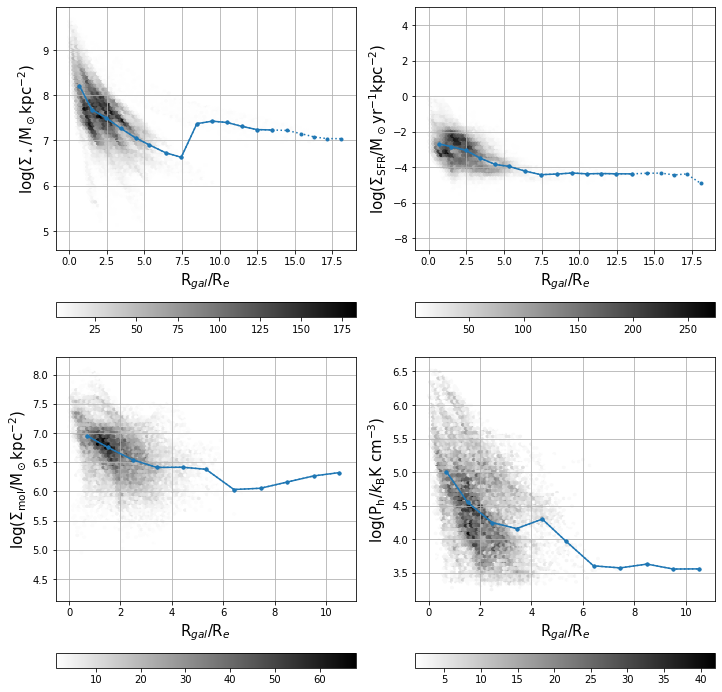

In [125]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR','log_S_mol_O3N2','log_P_h'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database['Rgal_Re'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.plot(total_byRgal_median['Rgal_Re'].to_numpy(),total_byRgal_median[name].to_numpy(),marker='.',ls=':',c='tab:blue',label='median values')
    ax.plot(total_byRgal_median.loc[total_byRgal.count()['Source']>=100,'Rgal_Re'].to_numpy(),total_byRgal_median.loc[total_byRgal.count()['Source']>=100,name].to_numpy(),marker='.',label='median values')
    
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

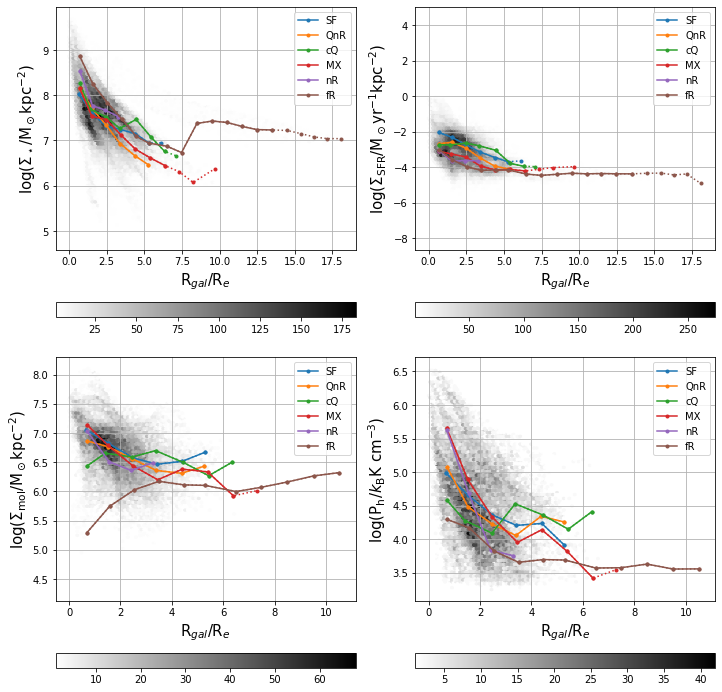

In [207]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_S_Mstar','log_S_SFR','log_S_mol_O3N2','log_P_h'],
                          [r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database['Rgal_Re'],Database[name],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
            ax.plot(total_byRgal_QS_median.loc[(QS,),'Rgal_Re'].to_numpy(),
                    total_byRgal_QS_median.loc[(QS,),name].to_numpy(),marker='.',c=color,ls=':')#,label=QS)
            count_mask = total_byRgal_QS.count().loc[(QS,),'Source']>=100
            ax.plot(total_byRgal_QS_median.loc[(QS,),'Rgal_Re'][count_mask].to_numpy(),
                    total_byRgal_QS_median.loc[(QS,),name][count_mask].to_numpy(),marker='.',c=color,label=QS)
    ax.legend(loc='best')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'R$_{gal}$/R$_e$',size=15)

fig.tight_layout()
plt.show()

In [131]:
np.unique(total_byQS.get_group('fR')['Source'])

array(['CGCG429-012', 'IC2341', 'NGC0155', 'NGC0731', 'NGC3300',
       'NGC7194'], dtype=object)

In [143]:
np.unique(SF_byQS.get_group('fR')['Source'])

array(['NGC0155', 'NGC3300'], dtype=object)

# Correlations between $\Sigma_\star$, $\Sigma_\mathrm{SFR}$, and $\Sigma_\mathrm{mol}$

In [213]:
mask = np.isfinite(Database_SF['log_S_SFR'])#SFR_mask_SF#
pearsonSF_SFR_Mstar = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_SFR'])

mask = np.isfinite(Database_SF['log_S_SFR'])&np.isfinite(Database_SF['log_S_mol_O3N2'])#SFR_mask_SF&CO_mask_SF&Ph_mask_SF
pearsonSF_SFR_mol = linregress(Database_SF.loc[mask,'log_S_mol_O3N2'],Database_SF.loc[mask,'log_S_SFR'])

mask = np.isfinite(Database_SF['log_S_mol_O3N2'])#CO_mask_SF&Ph_mask_SF
pearsonSF_mol_Mstar = linregress(Database_SF.loc[mask,'log_S_Mstar'],Database_SF.loc[mask,'log_S_mol_O3N2'])

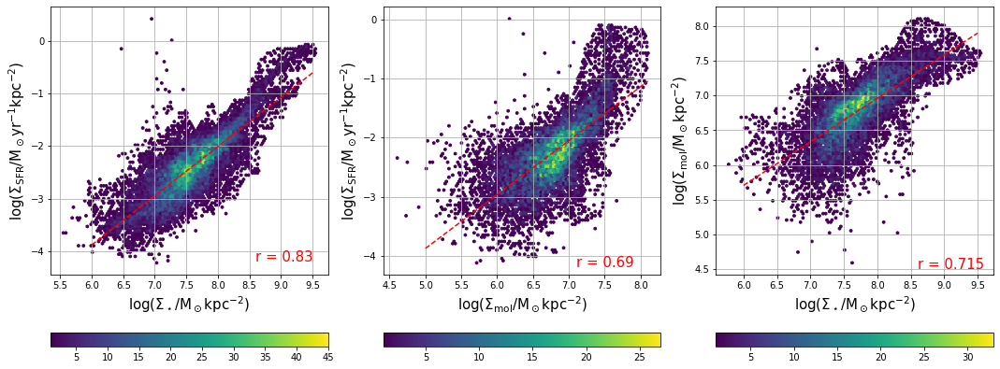

In [214]:
fig, axs = plt.subplots(1,3,figsize=(15,6))
im = axs[0].hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[0],orientation='horizontal')
axs[0].plot([6.,9.5],[pearsonSF_SFR_Mstar.intercept+6.*pearsonSF_SFR_Mstar.slope,pearsonSF_SFR_Mstar.intercept+9.5*pearsonSF_SFR_Mstar.slope],c='r',ls='--')
axs[0].text(8.6,-4.2,f'r = {pearsonSF_SFR_Mstar.rvalue:.3}',color='r',size=15)
axs[0].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[0].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[0].grid(True)
im = axs[1].hexbin(Database_SF['log_S_mol_O3N2'],Database_SF['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[1],orientation='horizontal')
axs[1].plot([5.,8.1],[pearsonSF_SFR_mol.intercept+5.*pearsonSF_SFR_mol.slope,pearsonSF_SFR_mol.intercept+8.1*pearsonSF_SFR_mol.slope],c='r',ls='--')
axs[1].text(7.1,-4.2,f'r = {pearsonSF_SFR_mol.rvalue:.3}',color='r',size=15)
axs[1].set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[1].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[1].grid(True)
im = axs[2].hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_mol_O3N2'],mincnt=1)
fig.colorbar(im,ax=axs[2],orientation='horizontal')
axs[2].plot([6.,9.5],[pearsonSF_mol_Mstar.intercept+6.*pearsonSF_mol_Mstar.slope,pearsonSF_mol_Mstar.intercept+9.5*pearsonSF_mol_Mstar.slope],c='r',ls='--')
axs[2].text(8.6,4.5,f'r = {pearsonSF_mol_Mstar.rvalue:.3}',color='r',size=15)
axs[2].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].grid(True)
fig.tight_layout()
plt.show()

In [221]:
Database_SF['S_mol_O3N2_new'] = Database_SF['S_mol_O3N2']*Database_SF['R_21']/0.65
Database_SF['log_S_mol_O3N2_new'] = np.log10(Database_SF['S_mol_O3N2_new'])

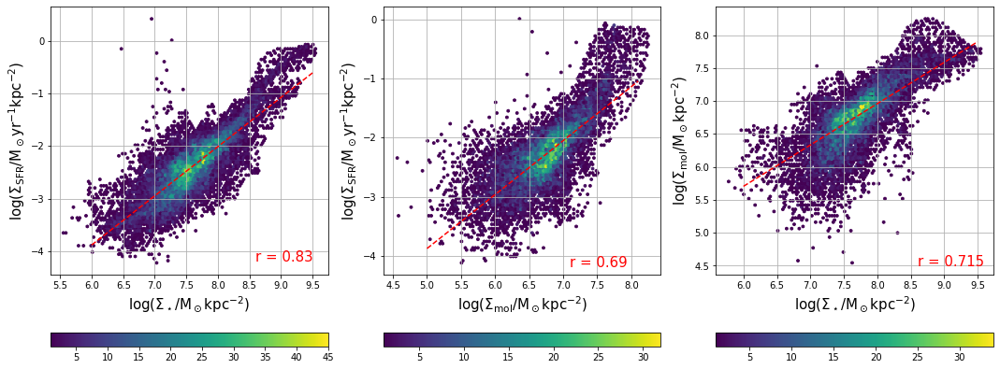

In [222]:
fig, axs = plt.subplots(1,3,figsize=(15,6))
im = axs[0].hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[0],orientation='horizontal')
axs[0].plot([6.,9.5],[pearsonSF_SFR_Mstar.intercept+6.*pearsonSF_SFR_Mstar.slope,pearsonSF_SFR_Mstar.intercept+9.5*pearsonSF_SFR_Mstar.slope],c='r',ls='--')
axs[0].text(8.6,-4.2,f'r = {pearsonSF_SFR_Mstar.rvalue:.3}',color='r',size=15)
axs[0].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[0].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[0].grid(True)
im = axs[1].hexbin(Database_SF['log_S_mol_O3N2_new'],Database_SF['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[1],orientation='horizontal')
axs[1].plot([5.,8.1],[pearsonSF_SFR_mol.intercept+5.*pearsonSF_SFR_mol.slope,pearsonSF_SFR_mol.intercept+8.1*pearsonSF_SFR_mol.slope],c='r',ls='--')
axs[1].text(7.1,-4.2,f'r = {pearsonSF_SFR_mol.rvalue:.3}',color='r',size=15)
axs[1].set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[1].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[1].grid(True)
im = axs[2].hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_mol_O3N2_new'],mincnt=1)
fig.colorbar(im,ax=axs[2],orientation='horizontal')
axs[2].plot([6.,9.5],[pearsonSF_mol_Mstar.intercept+6.*pearsonSF_mol_Mstar.slope,pearsonSF_mol_Mstar.intercept+9.5*pearsonSF_mol_Mstar.slope],c='r',ls='--')
axs[2].text(8.6,4.5,f'r = {pearsonSF_mol_Mstar.rvalue:.3}',color='r',size=15)
axs[2].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].grid(True)
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


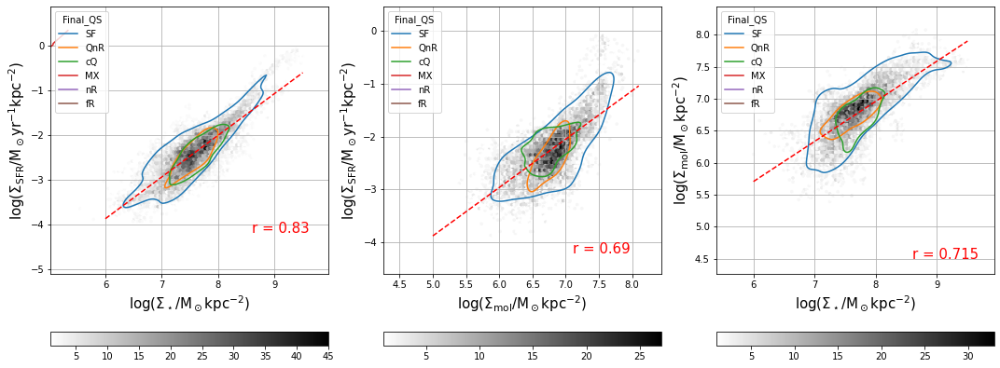

In [217]:
fig, axs = plt.subplots(1,3,figsize=(15,6))
im = axs[0].hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=axs[0],orientation='horizontal')
axs[0].plot([6.,9.5],[pearsonSF_SFR_Mstar.intercept+6.*pearsonSF_SFR_Mstar.slope,pearsonSF_SFR_Mstar.intercept+9.5*pearsonSF_SFR_Mstar.slope],c='r',ls='--')
axs[0].text(8.6,-4.2,f'r = {pearsonSF_SFR_Mstar.rvalue:.3}',color='r',size=15)
sns.kdeplot(Database_SF, x="log_S_Mstar", y='log_S_SFR',levels=[.35],hue_order=['SF','QnR','cQ','MX','nR','fR'],hue="Final_QS",ax=axs[0])
axs[0].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[0].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[0].grid(True)
im = axs[1].hexbin(Database_SF['log_S_mol_O3N2'],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=axs[1],orientation='horizontal')
axs[1].plot([5.,8.1],[pearsonSF_SFR_mol.intercept+5.*pearsonSF_SFR_mol.slope,pearsonSF_SFR_mol.intercept+8.1*pearsonSF_SFR_mol.slope],c='r',ls='--')
axs[1].text(7.1,-4.2,f'r = {pearsonSF_SFR_mol.rvalue:.3}',color='r',size=15)
sns.kdeplot(Database_SF, x="log_S_mol_O3N2", y='log_S_SFR',levels=[.35],hue_order=['SF','QnR','cQ','MX','nR','fR'],hue="Final_QS",ax=axs[1])
axs[1].set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[1].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[1].grid(True)
im = axs[2].hexbin(Database_SF['log_S_Mstar'],Database_SF['log_S_mol_O3N2'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=axs[2],orientation='horizontal')
axs[2].plot([6.,9.5],[pearsonSF_mol_Mstar.intercept+6.*pearsonSF_mol_Mstar.slope,pearsonSF_mol_Mstar.intercept+9.5*pearsonSF_mol_Mstar.slope],c='r',ls='--')
axs[2].text(8.6,4.5,f'r = {pearsonSF_mol_Mstar.rvalue:.3}',color='r',size=15)
sns.kdeplot(Database_SF, x="log_S_Mstar", y='log_S_mol_O3N2',levels=[.35],hue_order=['SF','QnR','cQ','MX','nR','fR'],hue="Final_QS",ax=axs[2])
axs[2].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].grid(True)
fig.tight_layout()
plt.show()

In [215]:
mask = np.isfinite(Database['log_S_SFR'])#SFR_mask_SF#
pearsontot_SFR_Mstar = linregress(Database.loc[mask,'log_S_Mstar'],Database.loc[mask,'log_S_SFR'])

mask = np.isfinite(Database['log_S_SFR'])&np.isfinite(Database['log_S_mol_O3N2'])#SFR_mask_SF&CO_mask_SF&Ph_mask_SF
pearsontot_SFR_mol = linregress(Database.loc[mask,'log_S_mol_O3N2'],Database.loc[mask,'log_S_SFR'])

mask = np.isfinite(Database['log_S_mol_O3N2'])#CO_mask_SF&Ph_mask_SF
pearsontot_mol_Mstar = linregress(Database.loc[mask,'log_S_Mstar'],Database.loc[mask,'log_S_mol_O3N2'])

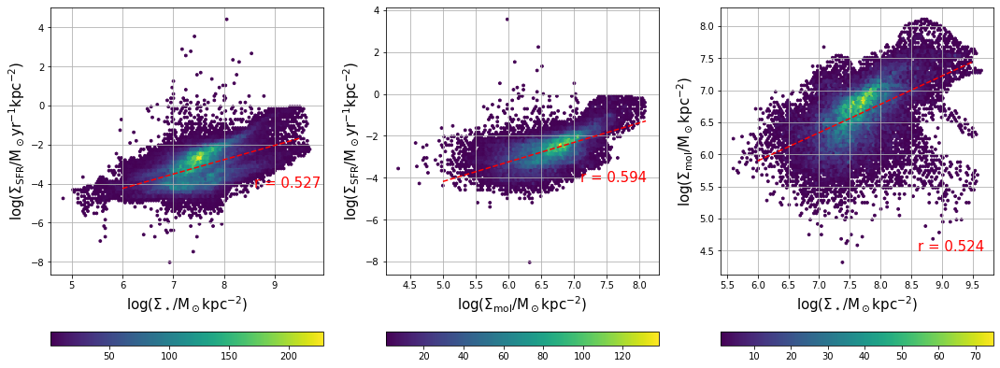

In [216]:
fig, axs = plt.subplots(1,3,figsize=(15,6))
im = axs[0].hexbin(Database['log_S_Mstar'],Database['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[0],orientation='horizontal')
axs[0].plot([6.,9.5],[pearsontot_SFR_Mstar.intercept+6.*pearsontot_SFR_Mstar.slope,pearsontot_SFR_Mstar.intercept+9.5*pearsontot_SFR_Mstar.slope],c='r',ls='--')
axs[0].text(8.6,-4.2,f'r = {pearsontot_SFR_Mstar.rvalue:.3}',color='r',size=15)
axs[0].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[0].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[0].grid(True)
im = axs[1].hexbin(Database['log_S_mol_O3N2'],Database['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[1],orientation='horizontal')
axs[1].plot([5.,8.1],[pearsontot_SFR_mol.intercept+5.*pearsontot_SFR_mol.slope,pearsontot_SFR_mol.intercept+8.1*pearsontot_SFR_mol.slope],c='r',ls='--')
axs[1].text(7.1,-4.2,f'r = {pearsontot_SFR_mol.rvalue:.3}',color='r',size=15)
axs[1].set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[1].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[1].grid(True)
im = axs[2].hexbin(Database['log_S_Mstar'],Database['log_S_mol_O3N2'],mincnt=1)
fig.colorbar(im,ax=axs[2],orientation='horizontal')
axs[2].plot([6.,9.5],[pearsontot_mol_Mstar.intercept+6.*pearsontot_mol_Mstar.slope,pearsontot_mol_Mstar.intercept+9.5*pearsontot_mol_Mstar.slope],c='r',ls='--')
axs[2].text(8.6,4.5,f'r = {pearsontot_mol_Mstar.rvalue:.3}',color='r',size=15)
axs[2].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].grid(True)
fig.tight_layout()
plt.show()

In [223]:
Database['S_mol_O3N2_new'] = Database['S_mol_O3N2']*Database['R_21']/0.65
Database['log_S_mol_O3N2_new'] = np.log10(Database['S_mol_O3N2_new'])

/tmp/ipykernel_1377194/4020897520.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Database['S_mol_O3N2_new'] = Database['S_mol_O3N2']*Database['R_21']/0.65
/tmp/ipykernel_1377194/4020897520.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Database['log_S_mol_O3N2_new'] = np.log10(Database['S_mol_O3N2_new'])


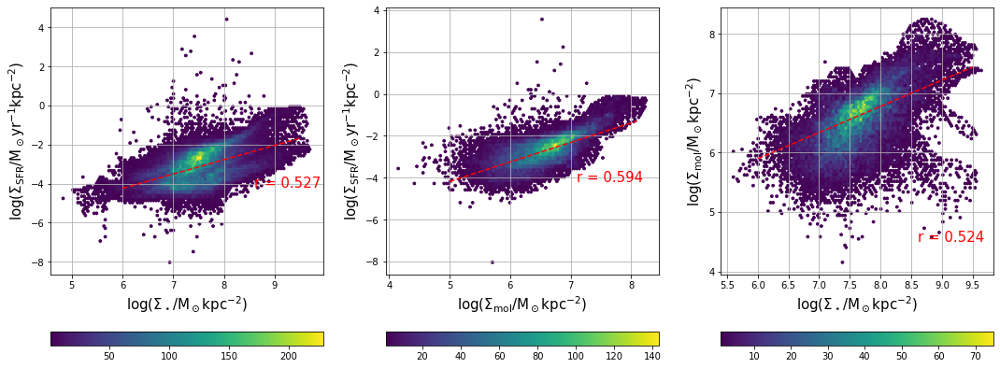

In [224]:
fig, axs = plt.subplots(1,3,figsize=(15,6))
im = axs[0].hexbin(Database['log_S_Mstar'],Database['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[0],orientation='horizontal')
axs[0].plot([6.,9.5],[pearsontot_SFR_Mstar.intercept+6.*pearsontot_SFR_Mstar.slope,pearsontot_SFR_Mstar.intercept+9.5*pearsontot_SFR_Mstar.slope],c='r',ls='--')
axs[0].text(8.6,-4.2,f'r = {pearsontot_SFR_Mstar.rvalue:.3}',color='r',size=15)
axs[0].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[0].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[0].grid(True)
im = axs[1].hexbin(Database['log_S_mol_O3N2_new'],Database['log_S_SFR'],mincnt=1)
fig.colorbar(im,ax=axs[1],orientation='horizontal')
axs[1].plot([5.,8.1],[pearsontot_SFR_mol.intercept+5.*pearsontot_SFR_mol.slope,pearsontot_SFR_mol.intercept+8.1*pearsontot_SFR_mol.slope],c='r',ls='--')
axs[1].text(7.1,-4.2,f'r = {pearsontot_SFR_mol.rvalue:.3}',color='r',size=15)
axs[1].set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[1].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[1].grid(True)
im = axs[2].hexbin(Database['log_S_Mstar'],Database['log_S_mol_O3N2_new'],mincnt=1)
fig.colorbar(im,ax=axs[2],orientation='horizontal')
axs[2].plot([6.,9.5],[pearsontot_mol_Mstar.intercept+6.*pearsontot_mol_Mstar.slope,pearsontot_mol_Mstar.intercept+9.5*pearsontot_mol_Mstar.slope],c='r',ls='--')
axs[2].text(8.6,4.5,f'r = {pearsontot_mol_Mstar.rvalue:.3}',color='r',size=15)
axs[2].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].grid(True)
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/users/brodriguez/.local/lib/python3.10/site-packages/seaborn/distributions.py:1176: UserWarning: No contour levels were found within the data range.
  cset = contour_func(


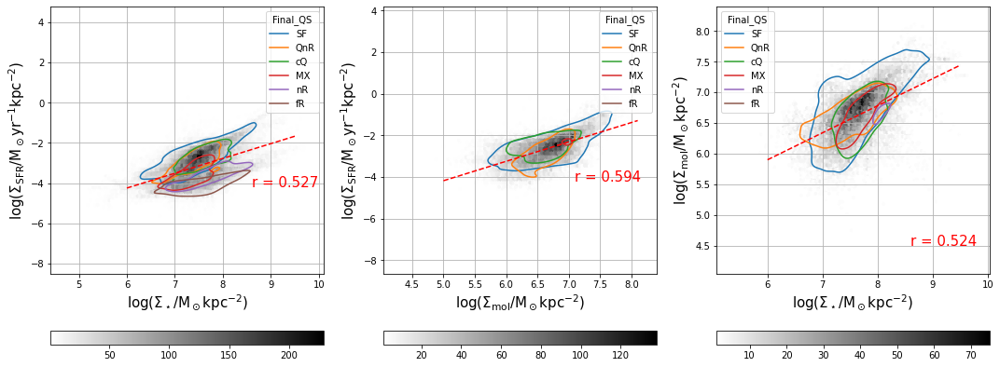

In [219]:
fig, axs = plt.subplots(1,3,figsize=(15,6))
im = axs[0].hexbin(Database['log_S_Mstar'],Database['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=axs[0],orientation='horizontal')
axs[0].plot([6.,9.5],[pearsontot_SFR_Mstar.intercept+6.*pearsontot_SFR_Mstar.slope,pearsontot_SFR_Mstar.intercept+9.5*pearsontot_SFR_Mstar.slope],c='r',ls='--')
axs[0].text(8.6,-4.2,f'r = {pearsontot_SFR_Mstar.rvalue:.3}',color='r',size=15)
sns.kdeplot(Database, x="log_S_Mstar", y='log_S_SFR',levels=[.35],hue_order=['SF','QnR','cQ','MX','nR','fR'],hue="Final_QS",ax=axs[0])
axs[0].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[0].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[0].grid(True)
im = axs[1].hexbin(Database['log_S_mol_O3N2'],Database['log_S_SFR'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=axs[1],orientation='horizontal')
axs[1].plot([5.,8.1],[pearsontot_SFR_mol.intercept+5.*pearsontot_SFR_mol.slope,pearsontot_SFR_mol.intercept+8.1*pearsontot_SFR_mol.slope],c='r',ls='--')
axs[1].text(7.1,-4.2,f'r = {pearsontot_SFR_mol.rvalue:.3}',color='r',size=15)
sns.kdeplot(Database, x="log_S_mol_O3N2", y='log_S_SFR',levels=[.35],hue_order=['SF','QnR','cQ','MX','nR','fR'],hue="Final_QS",ax=axs[1])
axs[1].set_xlabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[1].set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
axs[1].grid(True)
im = axs[2].hexbin(Database['log_S_Mstar'],Database['log_S_mol_O3N2'],mincnt=1,cmap='binary')
fig.colorbar(im,ax=axs[2],orientation='horizontal')
axs[2].plot([6.,9.5],[pearsontot_mol_Mstar.intercept+6.*pearsontot_mol_Mstar.slope,pearsontot_mol_Mstar.intercept+9.5*pearsontot_mol_Mstar.slope],c='r',ls='--')
axs[2].text(8.6,4.5,f'r = {pearsontot_mol_Mstar.rvalue:.3}',color='r',size=15)
sns.kdeplot(Database, x="log_S_Mstar", y='log_S_mol_O3N2',levels=[.35],hue_order=['SF','QnR','cQ','MX','nR','fR'],hue="Final_QS",ax=axs[2])
axs[2].set_xlabel(r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].set_ylabel(r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',size=15)
axs[2].grid(True)
fig.tight_layout()
plt.show()

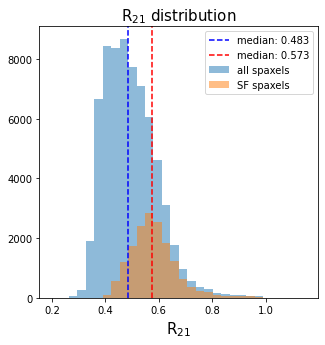

In [183]:
fig, ax = plt.subplots(figsize=(5,5))
ax.hist(Database['R_21'],bins=np.linspace(0.2,1.15,31),alpha=0.5,label=r'all spaxels')
ax.hist(Database_SF['R_21'],bins=np.linspace(0.2,1.15,31),alpha=0.5,label=r'SF spaxels')
median = np.nanmedian(Database['R_21'])
ax.axvline(median,ls='--',c='b',label=f'median: {median:.3}')
median = np.nanmedian(Database_SF['R_21'])
ax.axvline(median,ls='--',c='r',label=f'median: {median:.3}')
ax.set_xlabel(r'R$_\mathrm{21}$',size=15)
ax.set_title(r'R$_\mathrm{21}$ distribution',size=15)
ax.legend(loc='best')
plt.show()

In [40]:
alphaCO_MW = 4.3

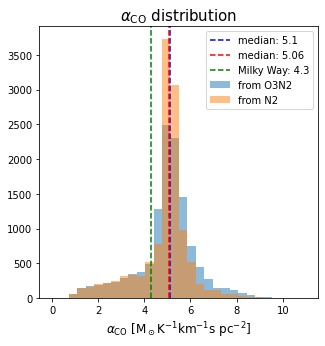

In [42]:
fig, ax = plt.subplots(figsize=(5,5))
ax.hist(Database_SF['alphaCO_O3N2'],bins=np.linspace(0.,11,31),alpha=0.5,label='from O3N2')
median1 = np.nanmedian(Database_SF['alphaCO_O3N2'])
ax.axvline(median1,ls='--',c='b',label=f'median: {median1:.3}')
ax.hist(Database_SF['alphaCO_N2'],bins=np.linspace(0.,11,31),alpha=0.5,label='from N2')
median2 = np.nanmedian(Database_SF['alphaCO_N2'])
ax.axvline(median2,ls='--',c='r',label=f'median: {median2:.3}')
ax.axvline(alphaCO_MW,ls='--',c='g',label=f'Milky Way: {alphaCO_MW:.3}')
ax.set_xlabel(r'$\alpha_\mathrm{CO}$ [M$_\odot$K$^{-1}$km$^{-1}$s pc$^{-2}$]',size=12)
ax.set_title(r'$\alpha_\mathrm{CO}$ distribution',size=15)
ax.legend(loc='best')
#ax.set_yscale('log')
plt.show()

In [195]:
aca_table = pd.read_csv('/users/brodriguez/Documents/ACA_sourcelist.csv',sep=',',index_col=0)
aca_table.info()

,califa_file,Final_QS,Final_NA,RA,DEC,inclination_ACA,PA_ACA,z_ACA,Dist_Mpc_ACA,Re_arc_ACA,z_stars,inclination_califa,PA_califa,Re_arc_califa,Re_kpc_califa,log_Mass,log_SFR_SF
source,,,,,,,,,,,,,,,,,
CGCG429-012,CGCG429-012,fR,nonA,339.207500,14.386972,60,4,0.01751,84,5.3,0.017464,59.991884,96.449515,3.919392,1.371765,10.506506,-2.172429
IC1079,IC1079,MX,nonA,224.150417,9.369750,50,81,0.02907,114,19.3,0.029067,53.368636,172.896524,19.981980,11.484491,11.335791,-1.888618
IC1528,IC1528,SF,nonA,1.272083,-7.093417,70,72,0.01250,48,16.9,0.012518,69.618338,163.338896,16.030980,4.062060,10.446165,0.204624
IC2341,IC2341,fR,nonA,125.922500,21.434861,60,2,0.01701,75,8.0,0.016950,59.210044,92.323697,5.628132,1.907830,10.766219,-1.695772
MCG-01-01-012,MCG-01-01-012,MX,nonA,359.795000,-4.191833,90,70,0.01883,78,11.2,0.018803,73.160751,162.159184,11.401920,4.296295,11.037187,-0.543660
MCG-01-10-015,MCG-01-10-015,SF,nonA,54.662917,-5.347333,73,75,0.01343,90,11.8,0.013407,73.160751,165.127792,12.829824,3.454377,10.021195,-0.158798
MCG-01-52-012,MCG-01-52-012,nR,nonA,309.457917,-6.090750,43,72,0.01270,100,4.5,0.012703,39.246907,158.522822,15.220728,3.886221,10.479028,-1.940627
MCG-02-02-030,MCG-02-02-030,QnR,sAGN,7.530417,-11.113639,70,170,0.01179,42,13.9,0.011777,69.592464,258.366666,12.412584,2.930599,10.513107,-0.124999
MCG-02-51-004,MCG-02-51-004,SF,nonA,303.915833,-13.622028,68,159,0.01876,90,15.8,0.018759,70.360150,250.342809,11.645784,4.383835,10.977911,0.733868


In [197]:
aca_table.loc[aca_table['Re_arc_califa']<10,'Re_arc_califa']

source
CGCG429-012    3.919392
IC2341         5.628132
NGC0155        9.200628
NGC0731        7.569324
NGC1056        8.229564
NGC1542        8.887392
NGC7194        3.564612
NGC7311        8.646408
NGC7364        7.982316
UGC01123       9.792324
UGC02099       8.607492
UGC08322       7.310016
VV488NED02     9.423000
Name: Re_arc_califa, dtype: float64

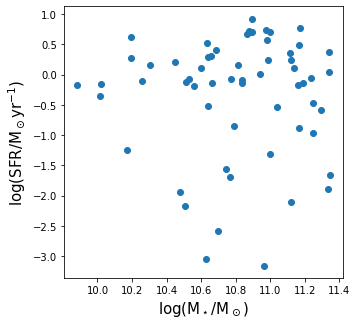

In [193]:
fig, ax = plt.subplots(figsize=(5,5))
ax.scatter(aca_table['log_Mass'].to_numpy(),aca_table['log_SFR_SF'].to_numpy())
ax.set_xlabel(r'log(M$_\star$/M$_\odot$)',size=15)
ax.set_ylabel(r'log(SFR/M$_\odot$yr$^{-1}$)',size=15)
plt.show()

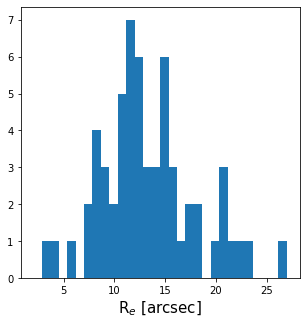

In [235]:
fig, ax = plt.subplots(figsize=(5,5))
ax.hist(aca_table['Re_arc_califa'],bins=np.linspace(2,27,31))
ax.set_xlabel(r'R$_e$ [arcsec]',size=15)
plt.show()

In [59]:
sources = np.unique(Database_SF['Source'])

In [145]:
Ph_binwidth = 0.5
SF_byPh = Database_SF.groupby(create_bins(Database_SF.loc[:,'log_P_h'],Ph_binwidth))
#means_Ph = grouped_Ph[['log_S_Mstar','log_S_SFR','R_21','Z_O3N2','Z_N2','alphaCO_O3N2','alphaCO_N2','log_S_mol_O3N2','CO_vdisp','star_vdisp','log_f_CO','log_sSFR','log_SFE','log_P_h']].mean()
SF_byPh_median = SF_byPh[['log_S_Mstar','log_S_SFR','R_21','Z_O3N2','Z_N2','alphaCO_O3N2','alphaCO_N2','log_S_mol_O3N2','CO_vdisp','star_vdisp','log_f_CO','log_sSFR','log_SFE','log_P_h']].median()

In [152]:
SF_byPh.count()['Source']

log_P_h
3.0     312
3.5    1855
4.0    3408
4.5    3242
5.0    1842
5.5     943
6.0     507
6.5       5
Name: Source, dtype: int64

In [159]:
(SF_byPh.count()['Source'])>100

log_P_h
3.0     True
3.5     True
4.0     True
4.5     True
5.0     True
5.5     True
6.0     True
6.5    False
Name: Source, dtype: bool

In [160]:
SF_byPh_median.loc[(SF_byPh.count()['Source'])>100,'log_P_h']

log_P_h
3.0    3.419911
3.5    3.818685
4.0    4.254268
4.5    4.738188
5.0    5.206753
5.5    5.696461
6.0    6.159674
Name: log_P_h, dtype: float64

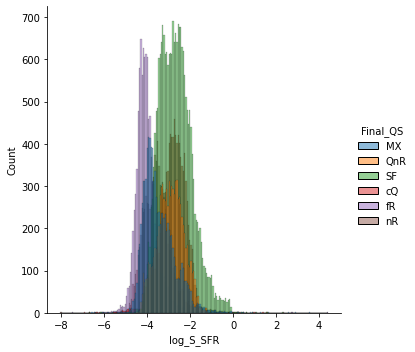

In [29]:
sns.displot(Database, x="log_S_SFR",hue="Final_QS")#,  kind="kde")#hue="Final_QS",

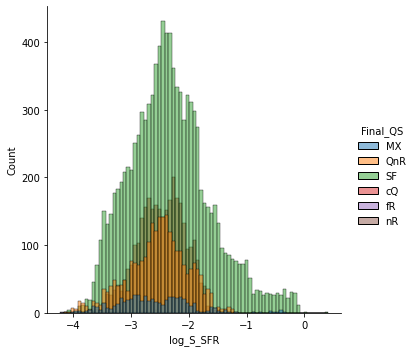

In [28]:
sns.displot(Database_SF, x="log_S_SFR",hue="Final_QS")#,  kind="kde")#hue="Final_QS",

In [91]:
S_SFR_binwidth = 1.
grouped_fCO = Database_SF.groupby(create_bins(Database_SF.loc[:,'log_f_CO'],0.5))
medians_fCO = grouped_fCO[['log_f_CO','log_S_SFR']].median()
grouped_Mstar = Database_SF.groupby(create_bins(Database_SF.loc[:,'log_S_Mstar'],0.5))
medians_Mstar = grouped_Mstar[['log_S_Mstar','log_S_SFR']].median()
grouped_Smol = Database_SF.groupby(create_bins(Database_SF.loc[:,'log_S_mol_O3N2'],0.5))
medians_Smol = grouped_Smol[['log_S_SFR','log_S_mol_O3N2']].median()

In [97]:
#S_SFR_binwidth = 1.
#grouped_QS = Database_SF.groupby([Database_SF.loc[:,'Final_QS'],create_bins(np.log10(Database_SF.loc[:,'P_h']),P_binwidth)])
grouped_fCO_QS = Database_SF.groupby([Database_SF.loc[:,'Final_QS'],create_bins(Database_SF.loc[:,'log_f_CO'],0.5)])
medians_fCO_QS = grouped_fCO_QS[['log_f_CO','log_S_SFR']].median()
grouped_Mstar_QS = Database_SF.groupby([Database_SF.loc[:,'Final_QS'],create_bins(Database_SF.loc[:,'log_S_Mstar'],0.5)])
medians_Mstar_QS = grouped_Mstar_QS[['log_S_Mstar','log_S_SFR']].median()
grouped_Smol_QS = Database_SF.groupby([Database_SF.loc[:,'Final_QS'],create_bins(Database_SF.loc[:,'log_S_mol_O3N2'],0.5)])
medians_Smol_QS = grouped_Smol_QS[['log_S_SFR','log_S_mol_O3N2']].median()
grouped_Ph_QS = Database_SF.groupby([Database_SF.loc[:,'Final_QS'],create_bins(Database_SF.loc[:,'log_P_h'],0.5)])
medians_Ph_QS = grouped_Ph_QS[['log_S_SFR','log_P_h']].median()

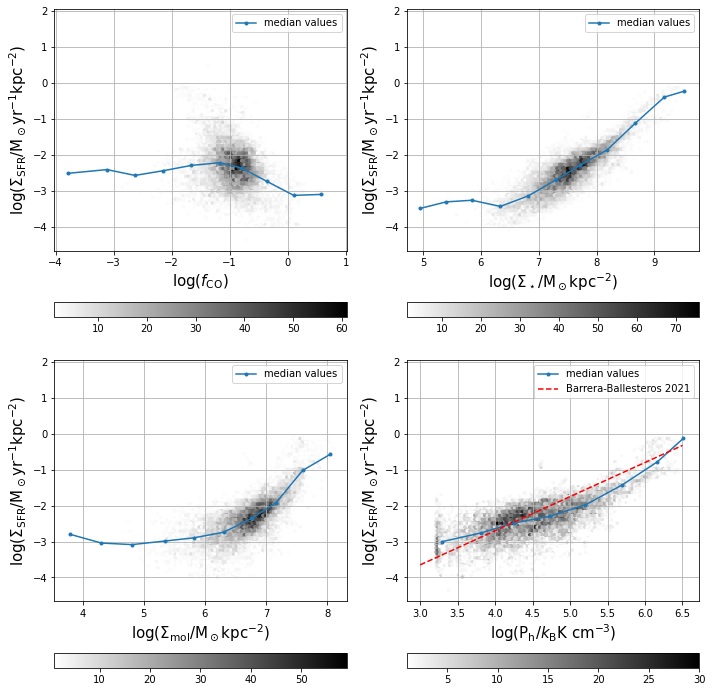

In [93]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label,medians in zip(axs.ravel(),['log_f_CO','log_S_Mstar','log_S_mol_O3N2','log_P_h'],
                          [r'log($f_\mathrm{CO}$)',r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)'],
                           [medians_fCO,medians_Mstar,medians_Smol,medians_Ph]):
    im = ax.hexbin(Database_SF[name],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    #print(stacked['P_h'].shape,frame.shape)
    #ax.plot(medians_SSFR[name].to_numpy(),medians_SSFR['log_S_SFR'].to_numpy(),marker='.',label='median values')
    ax.plot(medians[name].to_numpy(),medians['log_S_SFR'].to_numpy(),marker='.',label='median values')
    #ax.plot(np.log10(mean_stacked[name].to_numpy()),np.log10(mean_stacked['S_SFR'].to_numpy()),marker='.',label='mean values')
    ax.set_xlabel(label,size=15)
    ax.grid(True)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.legend(loc='best')
axs[1,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='r',ls='--',label='Barrera-Ballesteros 2021')
axs[1,1].legend(loc='best')
fig.tight_layout()
plt.show()

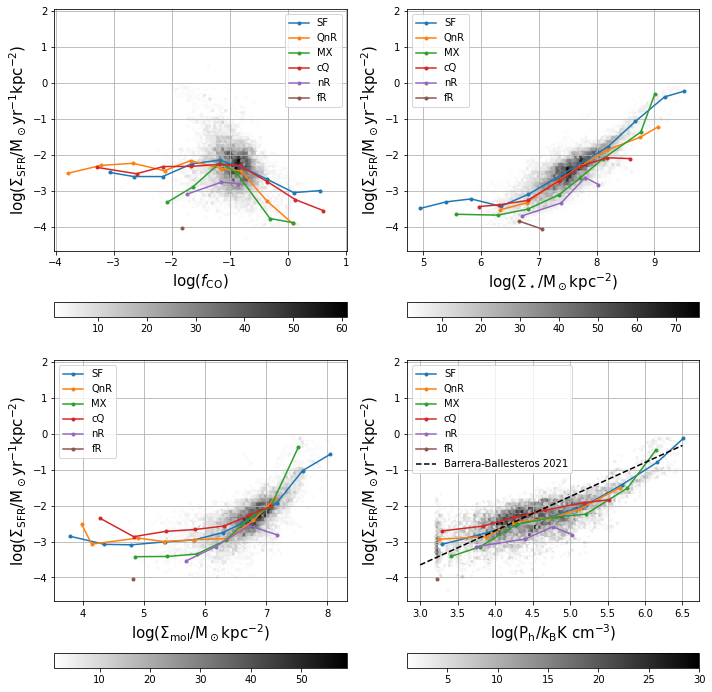

In [100]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label,medians in zip(axs.ravel(),['log_f_CO','log_S_Mstar','log_S_mol_O3N2','log_P_h'],
                          [r'log($f_\mathrm{CO}$)',r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)'],
                           [medians_fCO_QS,medians_Mstar_QS,medians_Smol_QS,medians_Ph_QS]):
    im = ax.hexbin(Database_SF[name],Database_SF['log_S_SFR'],mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    #print(stacked['P_h'].shape,frame.shape)
    for QS in ['SF','QnR','cQ','MX','nR','fR']:
        ax.plot(medians.loc[(QS,),name].to_numpy(),medians.loc[(QS,),'log_S_SFR'].to_numpy(),marker='.',label=QS)
    #ax.plot(medians[name].to_numpy(),medians['log_S_SFR'].to_numpy(),marker='.',label='median values')
    ax.set_xlabel(label,size=15)
    ax.grid(True)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.legend(loc='best')
axs[1,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='k',ls='--',label='Barrera-Ballesteros 2021')
axs[1,1].legend(loc='best')
fig.tight_layout()
plt.show()

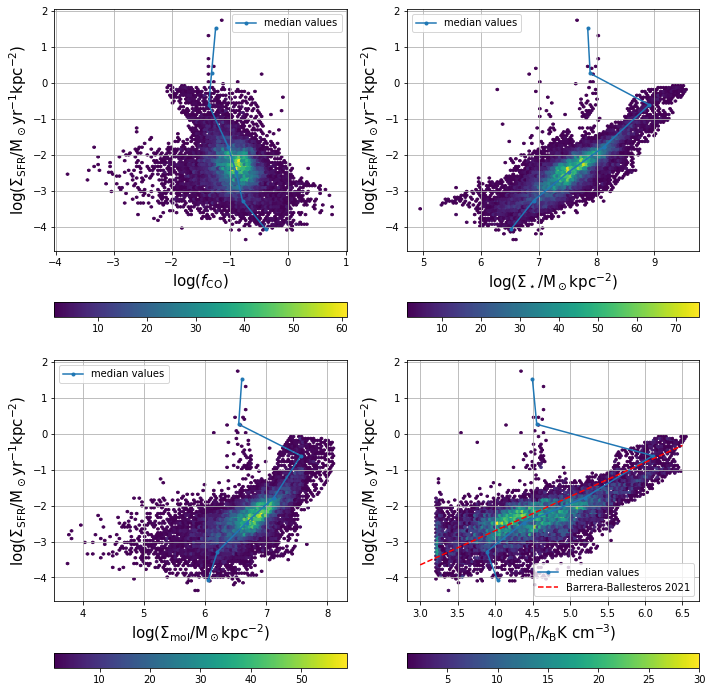

In [88]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,label in zip(axs.ravel(),['log_f_CO','log_S_Mstar','log_S_mol_O3N2','log_P_h'],
                          [r'log($f_\mathrm{CO}$)',r'log($\Sigma_\star$/M$_\odot$kpc$^{-2}$)',r'log($\Sigma_\mathrm{mol}$/M$_\odot$kpc$^{-2}$)',r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)']):
    im = ax.hexbin(Database_SF[name],Database_SF['log_S_SFR'],mincnt=1)#,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    #print(stacked['P_h'].shape,frame.shape)
    ax.plot(medians_SSFR[name].to_numpy(),medians_SSFR['log_S_SFR'].to_numpy(),marker='.',label='median values')
    #ax.plot(np.log10(mean_stacked[name].to_numpy()),np.log10(mean_stacked['S_SFR'].to_numpy()),marker='.',label='mean values')
    ax.set_xlabel(label,size=15)
    ax.grid(True)
    ax.set_ylabel(r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',size=15)
    ax.legend(loc='best')
axs[1,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='r',ls='--',label='Barrera-Ballesteros 2021')
axs[1,1].legend(loc='best')
fig.tight_layout()
plt.show()

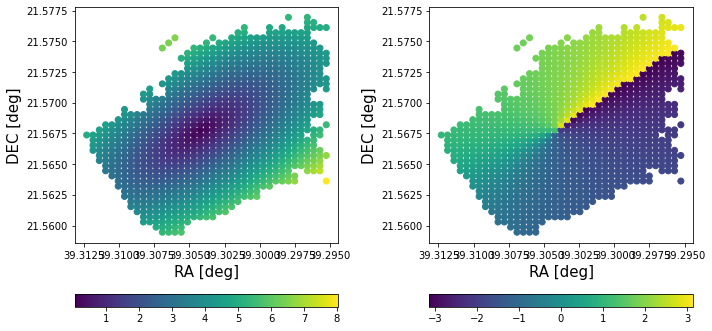

In [68]:
this_source = total_bysource.get_group('UGC02099')
fig, axs = plt.subplots(1,2,figsize=(10,5))
for ax, name in zip(axs.ravel(),['Rgal_Re','T_gal']):
    im = ax.scatter(this_source['RA'],this_source['DEC'],c=this_source[name])
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.set_xlabel('RA [deg]',size=15)
    ax.set_ylabel('DEC [deg]',size=15)
    ax.invert_xaxis()
fig.tight_layout()
plt.show()

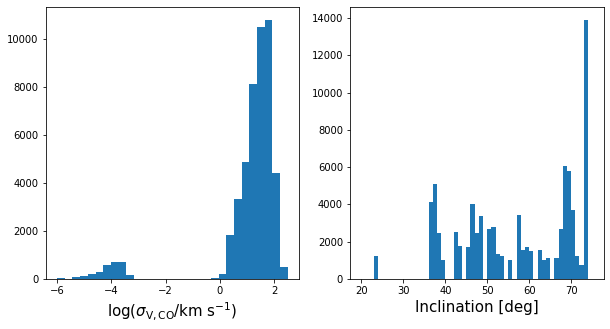

In [7]:
fig, axs = plt.subplots(1,2,figsize=(10,5))
axs[0].hist(np.log10(Database['CO_vdisp']),bins=np.linspace(-6,2.5,31))
axs[0].set_xlabel('log($\sigma_\mathrm{V,CO}$/km s$^{-1}$)',fontsize=15)
axs[1].hist(Database['Inclination'],bins=np.linspace(20,75,56))
axs[1].set_xlabel('Inclination [deg]',fontsize=15)
plt.show()

In [ ]:
Database.loc[np.log10(Database['CO_vdisp'])<=-1,['CO_vdisp','S_mol_O3N2','f_CO','SFE','P_h','P_DE']]=np.nan

In [226]:
def get_2dhist(xarr,yarr):
    H, xedges, yedges = np.histogram2d(xarr,yarr,bins=[np.linspace(np.nanmin(xarr),np.nanmax(xarr),51),np.linspace(np.nanmin(yarr),np.nanmax(yarr),51)])
    X = [(xedges[i]+xedges[i-1])/2 for i in range(1,len(xedges))]
    Y = [(yedges[i]+yedges[i-1])/2 for i in range(1,len(yedges))]
    return H.T, X, Y

In [176]:
histograms = {name:get_2dhist(np.log10(Database_SF['P_h']),np.log10(Database_SF[name])) for name in ['f_CO','S_SFR','sSFR','SFE']}

/users/brodriguez/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


/users/brodriguez/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/users/brodriguez/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


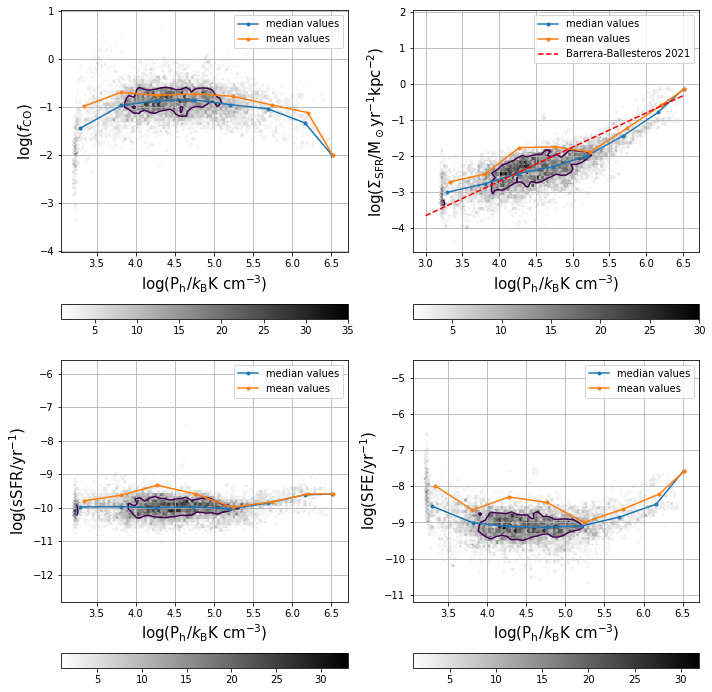

In [180]:
fig, axs = plt.subplots(2,2,figsize=(10,10))
for ax,name,title,label in zip(axs.ravel(),['f_CO','S_SFR','sSFR','SFE'],
                          [r'$f_\mathrm{CO}$',r'$\Sigma_\mathrm{SFR}$','sSFR','SFE'],[r'log($f_\mathrm{CO}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(np.log10(Database_SF['P_h']),np.log10(Database_SF[name]),mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    #print(stacked['P_h'].shape,frame.shape)
    ax.plot(np.log10(medians_Ph['P_h'].to_numpy()),np.log10(medians_Ph[name].to_numpy()),marker='.',label='median values')
    ax.plot(np.log10(mean_stacked['P_h'].to_numpy()),np.log10(mean_stacked[name].to_numpy()),marker='.',label='mean values')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.legend(loc='best')
    ax.contour(histograms[name][1],histograms[name][2],histograms[name][0],levels=[np.max(histograms[name][0])/2])
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='r',ls='--',label='Barrera-Ballesteros 2021')
#axs[0,1].contour(X,Y,H.T,levels=[np.max(H)/2])
axs[0,1].legend(loc='best')
fig.tight_layout()
plt.show()

In [196]:
histograms_QS = {(name,QS):get_2dhist(np.log10(grouped_QS_0.get_group(QS)['P_h']),np.log10(grouped_QS_0.get_group(QS)[name])) for name in ['f_CO','S_SFR','sSFR','SFE'] for QS in ['SF','QnR','cQ','MX','nR','fR']}

/users/brodriguez/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


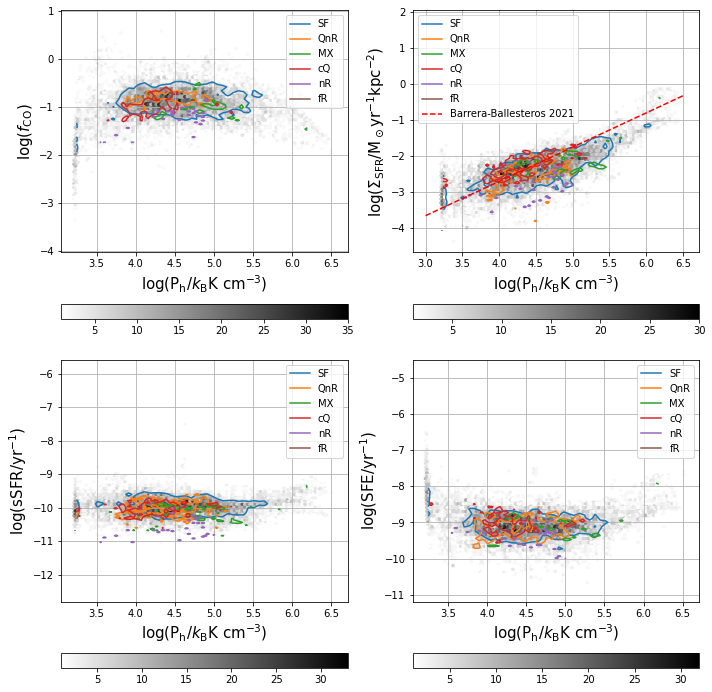

In [214]:
fig, axs = plt.subplots(2,2,figsize=(10,10))

for ax,name,title,label in zip(axs.ravel(),['f_CO','S_SFR','sSFR','SFE'],
                              [r'$f_\mathrm{CO}$',r'$\Sigma_\mathrm{SFR}$','sSFR','SFE'],[r'log($f_\mathrm{CO}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(np.log10(Database_SF['P_h']),np.log10(Database_SF[name]),mincnt=1,cmap='binary')
    fig.colorbar(im,ax=ax,orientation='horizontal')
    for QS,color in zip(['SF','QnR','cQ','MX','nR','fR'],mcolors.TABLEAU_COLORS):
        ax.plot([],[],c=color,label=QS)
        ax.contour(histograms_QS[(name,QS)][1],histograms_QS[(name,QS)][2],histograms_QS[(name,QS)][0],levels=[np.max(histograms_QS[(name,QS)][0])/3],colors=color)
        #ax.contour(histograms_QS[(name,QS)][1],histograms_QS[(name,QS)][2],histograms_QS[(name,QS)][0],levels=2,colors=color)
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    ax.legend(loc='best')
    
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='r',ls='--',label='Barrera-Ballesteros 2021')
axs[0,1].legend(loc='best')
fig.tight_layout()
plt.show()

/users/brodriguez/.local/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


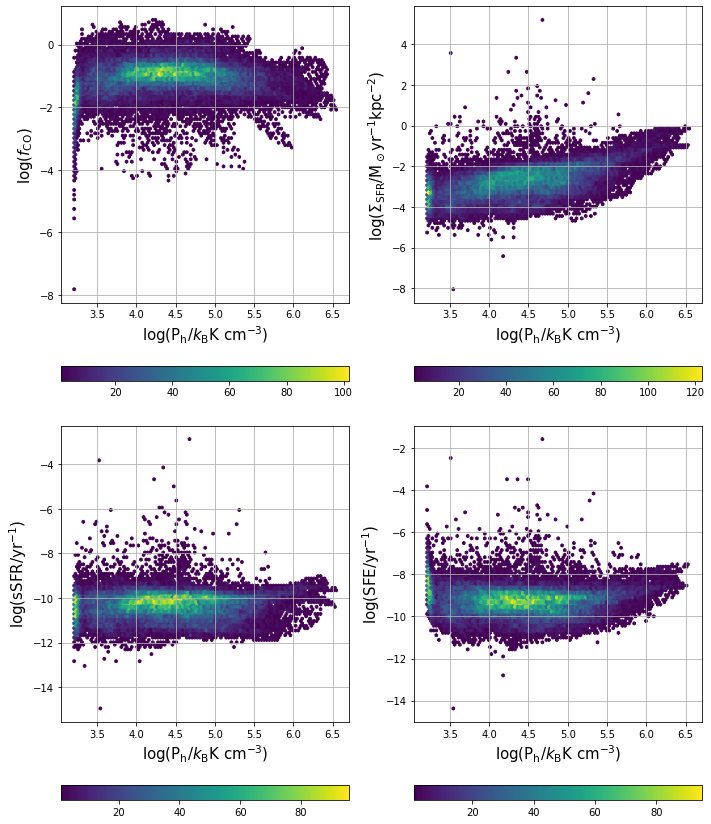

In [4]:
fig, axs = plt.subplots(2,2,figsize=(10,12))
for ax,frame,title,label in zip(axs.ravel(),[np.log10(Database['f_CO']),np.log10(Database['S_SFR']),np.log10(Database['sSFR']),np.log10(Database['SFE'])],
                          [r'$f_\mathrm{CO}$',r'$\Sigma_\mathrm{SFR}$','sSFR','SFE'],[r'log($f_\mathrm{CO}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(np.log10(Database['P_h']),frame,mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    #ax.legend(loc='best')
fig.tight_layout()
plt.show()

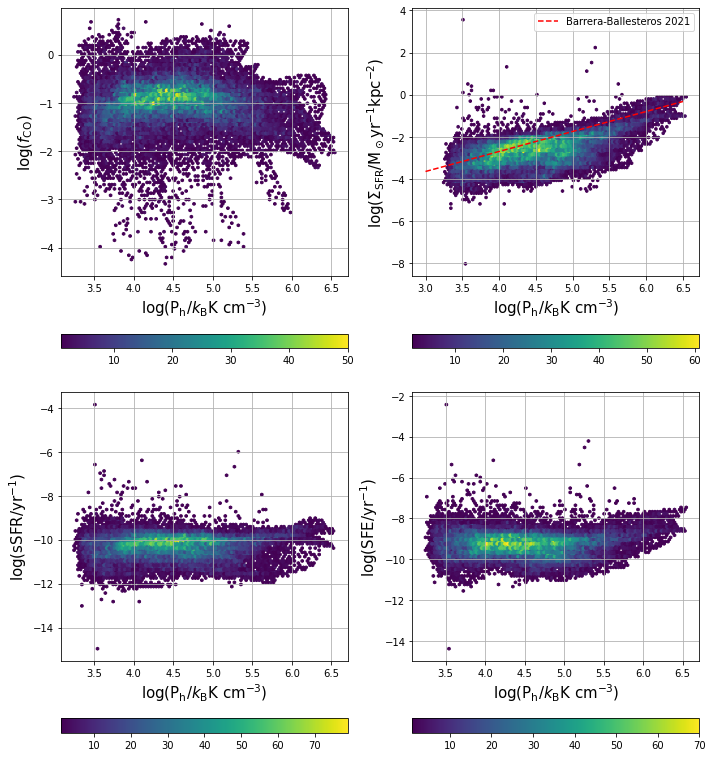

In [12]:
fig, axs = plt.subplots(2,2,figsize=(10,11))
for ax,name,title,label in zip(axs.ravel(),['log_f_CO','log_S_SFR','log_sSFR','log_SFE'],
                          [r'$f_\mathrm{CO}$',r'$\Sigma_\mathrm{SFR}$','sSFR','SFE'],[r'log($f_\mathrm{CO}$)',r'log($\Sigma_\mathrm{SFR}$/M$_\odot$yr$^{-1}$kpc$^{-2}$)',r'log(sSFR/yr$^{-1}$)',r'log(SFE/yr$^{-1}$)']):
    im = ax.hexbin(Database.loc[CO_mask,'log_P_h'],Database.loc[CO_mask,name],mincnt=1)
    fig.colorbar(im,ax=ax,orientation='horizontal')
    ax.set_ylabel(label,size=15)
    ax.grid(True)
    ax.set_xlabel(r'log(P$_\mathrm{h}$/$k_\mathrm{B}$K cm$^{-3}$)',size=15)
    
axs[0,1].plot([3.,6.5],[b*(3.-4)+A-3,b*(6.5-4)+A-3],c='r',ls='--',label='Barrera-Ballesteros 2021')
axs[0,1].legend(loc='best')
fig.tight_layout()
plt.show()